#<h1><center>  Proyecto EL7008 </center></h1>
## <h1><center> Visual Odometry for Self-Driving Cars </center></h1>

**Integrante**: 

Diego Pincheira

**Profesor**: 

Javier Ruiz del Solar

**Auxiliar**: 

Patricio Loncomilla

**Ayudantes**:  
Juan Pablo Cáceres

Hans Starke

Javier Smith

José Villagrán
                

**Fecha de Entrega**:

23 de Febrero de 2021

# Introducción

El presente informe aborda la implementación de dos algoritmos de *Visual Odometry* dentro del contexto de *Self-Driving Cars*. Para ello, se utilizará la base de datos de vehículos autónomos de Kitti-Benchmark (disponible en el sitio web http://www.cvlibs.net/datasets/kitti/), cuya dataset de interés  corresponde a una **secuencia de imágenes capturadas por un vehículo en movimiento mediante 4 cámaras**, en conjunto con los datos de calibración para estas últimas. Se busca **estimar el movimiento de la cámara en las secuencias**, utilizando técnicas de calibración, extracción de características locales, agrupamientos de características locales entre imágenes y estimación de movimiento mediante la estimación de la pose de la cámara.

Se procederá a **calibrar la cámara** con las imágenes de calibración, obteniendo variables que permiten describir dicha cámara, comparando dichas variables con los valores incluidos dentro de los archivos de calibración. Posteriormente se procederá a **extraer las características de las secuencias de imágenes objetivo**, calculando posteriormente **agrupaciones de dichas características** para el dataset correspondiente. Con la información anterior, se procederá a realizar la **estimación de movimiento** mediante dos métodos: *five-point* y *Perspective-n-Point*. Por último, se analizarán los resultados registrados, obteniendo finalmente conclusiones a partir de dichos análisis.

# Metodología

## Datasets a utilizar

Se utilizaron tres secuencias para el proyecto: **"2011_09_26_drive_0014"**, **"2011_09_26_drive_0036"** y **"2011_09_26_drive_0093"**, descargando los datos rectificados, no rectificados y la información para la calibración de las cámaras. Cada una de estas secuencias contiene, entre otros elementos, la información proveniente de 4 cámaras, catalogadas como "image_00", "image_01", "image_02" e "image_03"; las dos primeras corresponden a la cámara izquierda y derecha de una secuencia en escala de grises, mientras que las dos restantes corresponden a la cámara izquierda y derecha de una secuencia a color.

## Calibración de las cámaras

Se utilizan los **datos de calibración para las cámaras**, siendo los elementos de interés para esta actividad la matriz de parámetros intrínsecos, los coeficientes de distorsión, y la matriz de rotación y traslación entre las cámaras. En conjunto, se emplean secuencias de frames que contienen **múltiples tableros de ajedrez para la calibración de las cámaras**. Los archivos mencionados anteriormente están contenidos en el archivo **"2011_09_26_drive_0119_extract"**.

Se calibra la cámara utilizando las imágenes de los tableros de ajedrez. Cada imagen de la secuencia de calibración contiene múltiples tableros de ajedrez, por lo que, para calibrar la cámara correctamente, **se procesa individualmente cada tablero de ajedrez por separado**, localizando las intersecciones de la mayor cantidad de tableros posibles.

## Extracción de características y agrupamiento



Se extraen las características de cada imagen de la secuencia objetivo utilizando **descriptores SIFT u ORB**, guardando los *keypoints* obtenidos. Estos puntos de interés serán procesados mediante dos algoritmos de *Feature-Matching*: **Brute-Force Matching** (abreviado de ahora en adelante como BF), y **FLANN** (Fast Library for Approximate Nearest Neighbors), obteniendo agrupaciones de características entre la imagen i y la imagen i+1.

## Estimación de movimiento

Para estimar la posición de la cámara a través de la secuencia, es necesario calcular las **matrices de rotación (R) y vectores de traslación (t)** entre los frames de la secuencia, existiendo dos métodos principales que permiten estimar dichos elementos: *five-points* y *Perspective-n-Point* (PnP). El primero se utiliza con una sola cámara, mientras que el segundo es estéreo, requiriendo una cámara izquierda y una derecha a la vez.

*   **Five-Points:** Se busca estimar la matriz esencial, la cual se define de la siguiente manera: $$E = R[t]_x$$ Donde E corresponde a la matriz esencial, R corresponde a la matriz de rotación entre dos frames consecutivos, y t corresponde al vector de traslación entre los mismos frames consecutivos, y $[*]_x$ corresponde a la representación matricial del producto cruz.

*   **PnP:** Se busca estimar R y t mediante la siguiente ecuacion:
$$\begin{bmatrix}u\\v\\1\end{bmatrix} = K[R|t]\begin{bmatrix}x\\y\\z\\1\end{bmatrix} $$ Donde $[u,v]^T$ corresponde a las coordenadas de la imagen, K, R y t  corresponden a la matriz de parámetros intrínsecos de la cámara, la matriz de rotación y vector de traslación objetivos, y $[x,y,z,1]^T$ se refiere a las coordenadas 3D de la escena.

# Desarrollo

## Carga del dataset

Se permite el acceso al drive. Se requiere que en la carpeta de interés (por defecto es Proyecto_EL7008) se encuentren los archivos **'2011_09_26_calib.zip', '2011_09_26_drive_0014_sync.zip', '2011_09_26_drive_0036_sync.zip' '2011_09_26_drive_0093_sync.zip'** y **'2011_09_26_drive_0119_extract.zip'**, que contienen la información "Ground_Truth" de las cámaras, las secuencias **0014, 0036, y 0093**, y los tableros de ajedrez que permiten calibrar la cámara respectivamente. Posteriormente se cambia el directorio a la carpeta de interés , y se descomprimen los archivos.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from IPython.display import clear_output

In [ ]:
import os

In [ ]:
os.chdir('drive/MyDrive/Proyecto_EL7008/')

La celda siguiente descomprime los archivos .zip en la carpeta, por lo que si se utiliza el directorio de drive, se requiere que esta celda se ejecute **una sola vez**.

In [ ]:
!unzip '2011_09_26_calib.zip'
!unzip '2011_09_26_drive_0014_sync.zip'
!unzip '2011_09_26_drive_0036_sync.zip'
!unzip '2011_09_26_drive_0093_sync.zip'
!unzip '2011_09_26_drive_0119_extract.zip'
clear_output()
print('Archivos descomprimidos!')

El resultado de la siguiente celda debería imprimir al menos los siguientes elementos:

2011_09_26

2011_09_26_calib.zip

2011_09_26_drive_0014_sync.zip

2011_09_26_drive_0119_extract.zip

2011_09_26_drive_0036_sync.zip

2011_09_26_drive_0093_sync.zip

In [ ]:
!ls

## Librerías

Se cargan las librerías necesarias para la elaboración de los códigos.

In [ ]:
!pip install sparse
!pip install ipython-autotime
!pip install -U opencv-python
clear_output()
print('Librerías exportadas!')

Librerías exportadas!


In [ ]:
%load_ext autotime

time: 157 µs (started: 2021-02-23 16:57:03 +00:00)


In [ ]:
import numpy as np
import cv2
import glob
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import random
import natsort
import matplotlib.animation as anim
from matplotlib import rc
from skimage.transform import resize
plt.rcParams['animation.embed_limit'] = 2**128

time: 4.01 ms (started: 2021-02-23 16:58:36 +00:00)


## Funciones

Se elabora una serie de funciones que permite llevar a cabo las acciones requeridas.

### Calibración

Se crea la función **Generador_Puntos_Calibr()**, la cual retorna los puntos de objetos y los puntos de la imagen, en conjunto con la imagen objetivo en blanco y negro. Esta función itera sobre una imagen que contiene múltiples tableros de ajedrez, tomando estos de manera individual y almacenando los puntos de objetos y los puntos de la imagen. Esto se realiza fijando una posición (x,y) inicial que se ubique arriba a la izquierda de un tablero objetivo, a partir de la cual se trazará un rectángulo que abarque el tablero objetivo enmascarando al resto (cuidando de no encerrar a otros tableros), y se extraerán los puntos de imagen y objetos correspondientes.

Esta función recibe los siguientes parámetros:


*   Pto_Init_X : Lista con las coordenadas x de los puntos de inicio a partir de los cuales se traza el rectángulo de enmascaramiento.
*  Pto_Init_Y : Lista con las coordenadas y de los puntos de inicio a partir de los cuales se traza el rectángulo de enmascaramiento.
*   W_Size_X : Lista con los largos de los rectángulos de enmascaramiento.
*   W_Size_X : Lista con los valores de altura de los rectángulos de enmascaramiento.
*   Ins_Corn_X : Lista con la cantidad de esquinas interiores **en el eje horizonal** del tablero objetivo.
*   Ins_Corn_X : Lista con la cantidad de esquinas interiores **en el eje vertical** del tablero objetivo.
*   Str_Sec : String que determina cual cámara se elegirá. Los valores posibles son '00', '01', '02', '03'.
*   Show_Imgs : Booleano que determina si se muestran los tableros enmascarados.
*   Show_Detected : Booleano que determina si se muestran los tableros detectados.

El código base para generar esta función se encuentra en el siguiente sitio web: https://docs.opencv.org/master/dc/dbb/tutorial_py_calibration.html


In [ ]:
def Generador_Puntos_Calibr(Pto_Init_X, Pto_Init_Y, W_Size_X, W_Size_Y, Ins_Corn_X, Ins_Corn_Y, Str_Sec, Show_Imgs = True, Show_Detected = True):
  Objpoints_Obj = []
  Imgpoints_Obj = []
  imagen = cv2.imread('2011_09_26/2011_09_26_drive_0119_extract/image_' + Str_Sec + '/data/0000000000.png')
  criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
  for x,y,w,h,nx,ny in zip(Pto_Init_X,Pto_Init_Y,W_Size_X,W_Size_Y,Ins_Corn_X,Ins_Corn_Y):
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)
    mask = np.zeros(imagen.shape,np.uint8)
    mask[y:y+h,x:x+w] = imagen[y:y+h,x:x+w]
    if Show_Imgs:
      print('Chessboard:', Pto_Init_X.index(x) + 1)
      cv2_imshow(mask)
    img = mask
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the Chesse board corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    # If corners are found, add object points, image points
    # If corners are found, add object points, image points
    if ret == True:
        Imgpoints_Obj.append(corners)
        Objpoints_Obj.append(objp)
        
        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        if Show_Detected:
          cv2_imshow(img)
  Img_Gray = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  return Objpoints_Obj, Imgpoints_Obj, Img_Gray

time: 25 ms (started: 2021-02-23 16:59:04 +00:00)


### Extracción de características

Se crean 3 funciones a continuación: 


*   **Features()**: Dado un string con el directorio objetivo, un string con el tipo de descriptor a utilizar y un string con el tipo de feature-matching a utilizar, calcula los puntos de interés y los descriptores de las imágenes contenidas en el directorio, calculando calces entre la imagen i y la imagen i+1. Esta función retorna el conjunto de calces totales, dos listas con los puntos de interés encontrados entre las imagenes i e i+1, y dos listas que contienen los calces entre las imágenes i e i+1.
*   **Matcher()**: Esta función recibe un string objetivo (BF o FLANN), retornando el matcher a utilizar: Brute Force, o FLANN. Recibe además un String con el descriptor a utilizar, con el fin de ocupar otros parámetros si este es ORB.
*   **Random_Sample_Imgs()**: Dado un string con el directorio de las imágenes, un conjunto de calces totales, dos listas con los keypoints entre los frames i e i+1, y un entero N, extrae N imágenes mostrando los calces en común.


Los códigos bases utilizados para implementar estas funciones se encuentran disponibles en los siguientes sitios:

*OpenCV: Feature Matching*: https://docs.opencv.org/3.4/dc/dc3/tutorial_py_matcher.html

*OpenCV: Introduction to SIFT (Scale-Invariant Feature Transform)*: https://docs.opencv.org/3.4/da/df5/tutorial_py_sift_intro.html

*OpenCV: ORB (Oriented FAST and Rotated BRIEF)*: https://docs.opencv.org/3.4/d1/d89/tutorial_py_orb.html

In [ ]:
def Features(Str_Obj, Descriptor = 'sift', Str_Matcher_Obj = 'BF'):
  Lista_Imgs_Obj = natsort.natsorted(os.listdir(Str_Obj))
  Lista_Kp1_Obj, Lista_Kp2_Obj, Lista_Des1_Obj, Lista_Des2_Obj = [], [], [], []
  if Descriptor == 'sift':
    Descriptor_Obj = cv2.SIFT_create()
  elif Descriptor == 'orb':
    Descriptor_Obj = cv2.ORB_create()
  else:
    return None
  for i in range(len(Lista_Imgs_Obj)-1):
    # Se generan los puntos de interés y los descriptores
    kp1, des1 = Descriptor_Obj.detectAndCompute(cv2.imread(Str_Obj + Lista_Imgs_Obj[i]),None)
    kp2, des2 = Descriptor_Obj.detectAndCompute(cv2.imread(Str_Obj + Lista_Imgs_Obj[i+1]),None)
    Lista_Kp1_Obj.append(kp1)
    Lista_Des1_Obj.append(des1)
    Lista_Kp2_Obj.append(kp2)
    Lista_Des2_Obj.append(des2)
  Matcher_Obj = Matcher(Str_Matcher_Obj, Descriptor)
  Elem_Obj, Pts_1_Obj, Pts_2_Obj  = [], [], []
  for i in range(len(Lista_Imgs_Obj)-1):
    matches = Matcher_Obj.knnMatch(Lista_Des1_Obj[i],Lista_Des2_Obj[i], k=2) # Se generan los matches
    good = []
    pts1 = []
    pts2 = []
    if Descriptor == 'orb' and Str_Matcher_Obj == 'FLANN':
      Elem_Obj.append(matches)
      for j, pair in enumerate(matches):
        try:
            m, n = pair
            if m.distance < 0.8*n.distance:
                good.append(m)
                pts2.append(Lista_Kp2_Obj[i][m.trainIdx].pt)
                pts1.append(Lista_Kp1_Obj[i][m.queryIdx].pt)
        except ValueError:
            pass
    else:
      for m,n in matches:
          if m.distance < 0.8*n.distance:
              good.append([m])
              pts2.append(Lista_Kp2_Obj[i][m.trainIdx].pt)
              pts1.append(Lista_Kp1_Obj[i][m.queryIdx].pt)
      Elem_Obj.append(good)
    Pts_1_Obj.append(np.expand_dims(pts1,axis=1))
    Pts_2_Obj.append(np.expand_dims(pts2,axis=1))
  #if Descriptor == 'orb' and Str_Matcher_Obj == 'FLANN':
  #  Elem_Obj = matches
  #else:
  #  Elem_Obj = good
  return Elem_Obj, Lista_Kp1_Obj,Lista_Kp2_Obj, Pts_1_Obj, Pts_2_Obj

time: 48.3 ms (started: 2021-02-23 16:59:05 +00:00)


In [ ]:
def Random_Sample_Imgs(Str_Obj, Elem_Obj, Lista_Kp1_Obj,Lista_Kp2_Obj, Num = 10):
  Lista_Imgs_Obj = natsort.natsorted(os.listdir(Str_Obj))
  for i in random.sample(range(len(Lista_Imgs_Obj)-1), Num):
      img_match = cv2.drawMatchesKnn(cv2.imread(Str_Obj + Lista_Imgs_Obj[i]), Lista_Kp1_Obj[i], cv2.imread(Str_Obj + Lista_Imgs_Obj[i+1]), Lista_Kp2_Obj[i],
                                      Elem_Obj[i], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
      fig = plt.figure(figsize=(20, 10))
      plt.imshow(img_match)

time: 6.82 ms (started: 2021-02-23 16:59:05 +00:00)


In [ ]:
def Matcher(Str_Obj,Descriptor_Obj):
  if Str_Obj == 'BF':
    matcher = cv2.BFMatcher()
    return matcher
  elif Str_Obj == 'FLANN':
    FLANN_INDEX_KDTREE = 1
    FLANN_INDEX_LSH = 6
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    if Descriptor_Obj == 'orb':
      index_params= dict(algorithm = FLANN_INDEX_LSH,
                   table_number = 6, # 12
                   key_size = 12,     # 20
                   multi_probe_level = 1) #2
    search_params = dict(checks=50)
    matcher = cv2.FlannBasedMatcher(index_params,search_params)
    return matcher
  else:
    return None

time: 10.4 ms (started: 2021-02-23 16:59:05 +00:00)


### Estimación de movimiento

Se implementan dos algoritmos de estimación de movimiento: **Five-Points**, y **Perspective-n-Point (PnP)**.

#### Five-Points

La función **Matriz Esencial()** retorna, a partir de dos listas con los calces encontrados entre las imágenes i e i+1 de una secuencia objetivo y una matriz de parámetros intrínsecos de la cámara objetivo, la **matriz esencial entre los dos frames consecutivos**, a su vez de entregar **la matriz de rotación y la matriz de traslación** para cada par (i, i+1) de la secuencia.

In [ ]:
def Matriz_Esencial(Pts_1_Obj,Pts_2_Obj, Mtx_Obj):
  Mtx_Ess_Obj = []
  Mtx_Rot_Obj = []
  Mtx_Trl_Obj = []
  for i in range(len(Pts_1_Obj)):
    E, mask = cv2.findEssentialMat(Pts_1_Obj[i],Pts_2_Obj[i], Mtx_Obj, method = cv2.RANSAC, prob=.999, threshold=3.0)
    points, R, t, mask = cv2.recoverPose(E, Pts_1_Obj[i],Pts_2_Obj[i],Mtx_Obj)
    Mtx_Ess_Obj.append(E)
    Mtx_Rot_Obj.append(R)
    Mtx_Trl_Obj.append(t)
  return Mtx_Ess_Obj, Mtx_Rot_Obj, Mtx_Trl_Obj

time: 11 ms (started: 2021-02-23 16:59:05 +00:00)


Se tiene la función **Movimiento_R_t()** la cual, dado una lista con las matrices de rotación a utilizar, una lista con las matrices de traslación a utilizar, un largo opcional respecto al frame final con el que se terminará la función, un string con el el tipo de descriptor utilizado y un string con el tipo de matcher utilizado, **calcula la trayectoria por cada frame, utilizando las matrices de rotación y traslación entregadas**. Para ello, se fija el punto (0,0,0) como la coordenada inicial, y se concatenan las operaciones de transformación utilizando la matriz de rotación y el vector de traslación determinadas, actualizando así la posición frame a frame. Posteriormente, se procede a mostrar en pantalla la trayectoria total realizada por el vehículo. Finalmente, se retorna una lista con las posiciones de la cámara.

In [ ]:
def Movimiento_R_t(Mtx_Rot_Obj, Mtx_Trl_Obj, Forma = 'b', Largo_Opc = None, Descriptor = 'sift', Str_Matcher_Obj = 'BF'):
  Pos = []
  CC = np.array([[-1, 0, 0],[0, -1, 0],[0, 0, -1]])
  X_0 = np.array([0., 0., 0.])
  X_i = X_0.copy()
  Pos.append(np.matmul(CC, X_i))
  if Largo_Opc != None:
    Largo_Obj = Largo_Opc
  else:
    Largo_Obj = len(Mtx_Rot_Obj)
  if Forma == 'a':
    for i in range(Largo_Obj):
      X_i = Mtx_Rot_Obj[i] @ X_i + Mtx_Trl_Obj[i].flatten()
      Pos.append(np.matmul(CC, X_i))
  elif Forma == 'b':
    Ere = Mtx_Rot_Obj[0]
    for i in range(Largo_Obj):
      X_i = X_i + Ere.dot(Mtx_Trl_Obj[i].flatten())
      Ere = Mtx_Rot_Obj[i].dot(Ere)
      Pos.append(np.matmul(CC, X_i))
  Pos = np.array(Pos)
  #print(Pos)
  plt.scatter(-Pos[:-1,0], -Pos[:-1,1])
  plt.scatter(-Pos[-1,0], -Pos[-1,1])
  plt.title('Movimiento de la cámara aplicando Matriz Esencial utilizando ' + Descriptor + ' y ' + Str_Matcher_Obj)
  plt.legend(['Trayectoria hasta el momento', 'Último Punto: i = ' + str(Largo_Obj)])
  plt.xlabel('Eje x')
  plt.ylabel('Eje y')
  plt.show()
  return Pos

time: 22.7 ms (started: 2021-02-23 16:59:05 +00:00)


Por último, la función **Animacion_Ruta()** ilustra una *animación interactiva* de la trayectoria seguida por el vehículo en conjunto con los frames proporcionados al estimador.

In [ ]:
def Animacion_Ruta(Str_Obj, Pos_Obj,Ratio = 3, Largo_Opc = None, Descriptor = 'SIFT', Str_Matcher_Obj = 'BF'):
    Lista_Imgs_Obj = natsort.natsorted(os.listdir(Str_Obj))
    if Largo_Opc != None:
      Largo_Obj = Largo_Opc
    else:
      Largo_Obj = len(Pos_Obj)

    fig = plt.figure(figsize=(10, 10))
    fig.suptitle('Movimiento de la cámara aplicando Matriz Esencial utilizando ' + Descriptor + ' y ' + Str_Matcher_Obj)
    # Subplot de la ruta estimada
    ax1 = fig.add_subplot(2,2,2)
    Img_Obj = cv2.imread(Str_Obj + Lista_Imgs_Obj[0*Ratio])
    im = ax1.imshow(Img_Obj)
    # Subplot de la imagen
    ax2 = fig.add_subplot(2,2,1)
    ax2.legend(['Trayectoria hasta el momento'])
    ax2.set_xlabel('Eje x')
    ax2.set_ylabel('Eje y')
    im2 = ax2.scatter(-Pos_Obj[0*Ratio,0], -Pos_Obj[0*Ratio,1])

    def updateImg(j):
      Img_Obj_2 = cv2.imread(Str_Obj + Lista_Imgs_Obj[j*Ratio])
      im.set_data(Img_Obj_2)
      return im
    
    def updateRuta(j):
      if j == 0:
        return ax2.scatter(-Pos_Obj[0*Ratio,0], -Pos_Obj[0*Ratio,1])
      return ax2.scatter(-Pos_Obj[:j*Ratio,0], -Pos_Obj[:j*Ratio,1],color='blue')
    
    def updateAmbos(j):
      a = updateRuta(j)
      ax2.legend(['Trayectoria hasta el momento'])
      b = updateImg(j)
      return b, a

    anima = anim.FuncAnimation(fig, updateAmbos, frames=int(Largo_Obj/Ratio), interval=200, blit=True,repeat_delay=1000)
    return anima

time: 30.9 ms (started: 2021-02-23 16:59:05 +00:00)


#### Perspective-n-Point


Se implementan dos funciones:

*   **PnP_Mappping()**: Esta función recibe los directorios de las secuencias estéreo objetivo (un directorio para la cámara izquierda y otro para la derecha), matrices de parámetros intrínsecos y coeficientes de distorsión para ambas cámaras, y una matriz de rotación y un vector de traslación entre ambas cámaras, calculando los mapas de transformación requeridos, y entregando finalmente los mapas de disparidad calculados mediante los mapas de transformación empleando la función Mapping_Aux().

*   **Mapping_Aux()**: Esta función recibe los directorios de las secuencias estéreo objetivo, los mapas de transformación calculados anteriormente, y la matriz de transformación de perspectiva Q, entregando los mapas de disparidad para cada frame de la secuencia estéreo.

In [ ]:
def PnP_Mapping(Str_Obj_L, Str_Obj_R, Mtx_00_Obj, Dist_00_Obj, Mtx_01_Obj, Dist_01_Obj, Rot_01_Obj, Trl_01_Obj, Largo=1):
  Lista_Imgs_Obj_L = natsort.natsorted(os.listdir(Str_Obj_L))
  Img_Base = cv2.cvtColor(cv2.imread(Str_Obj_L + Lista_Imgs_Obj_L[0]), cv2.COLOR_BGR2GRAY)
  # Se obtienen los siguientes parámetros:
  ### La matriz de reproyección Q, matrices de proyeccion P1 y P2,
  ### y matrices de transformada de rectificacion R1 y R2 de cada 
  ### cámara mediante rectificacion stereo.
  R1, R2, P1, P2, Q, validPixROI1, validPixROI2 = cv2.stereoRectify(Mtx_00_Obj,
                                                                    Dist_00_Obj,
                                                                    Mtx_01_Obj,
                                                                    Dist_01_Obj,
                                                                    Img_Base.shape[::-1],
                                                                    Rot_01_Obj,
                                                                    Trl_01_Obj)
  # Se obtienen los mapas de transformación para cada cámara:
  leftMapX, leftMapY = cv2.initUndistortRectifyMap(
      Mtx_00_Obj, Dist_00_Obj, R1, P1,
      Img_Base.shape[::-1], cv2.CV_32FC1)
  rightMapX, rightMapY = cv2.initUndistortRectifyMap(
      Mtx_01_Obj, Dist_01_Obj, R2, P2,
      Img_Base.shape[::-1], cv2.CV_32FC1)
  # Se aplican los mapas de transformación a cada secuencia, 
  # obteniendo 2 imagenes x cada frame.
  # Por último, se obtiene para cada frame un mapa de disparidad
  # a partir de las imgs remapeadas.
  Puntos_2D, Puntos_3D = Mapping_Aux(Str_Obj_L, Str_Obj_R,
                                 leftMapX, leftMapY,
                                 rightMapX, rightMapY, Q,
                                 Largo)
  return Puntos_2D, Puntos_3D

time: 16.8 ms (started: 2021-02-23 16:59:05 +00:00)


In [ ]:
def Mapping_Aux(Str_Obj_L, Str_Obj_R, leftMapX_Obj, leftMapY_Obj, rightMapX_Obj, rightMapY_Obj, Q_Obj, Largo):
  Lista_Imgs_Obj_L = natsort.natsorted(os.listdir(Str_Obj_L))
  Lista_Imgs_Obj_R = natsort.natsorted(os.listdir(Str_Obj_R))
  Puntos_2D, Puntos_3D = [], []
  # Para cada frame, se obtiene un mapa de disparidad a partir de las imgs remapeadas:
  for i in range(len(Lista_Imgs_Obj_L)-1):#len(Lista_Imgs_Obj_L)-1
    # Se extraen las imágenes de las secuencias y se remapean
    img_l = cv2.imread(Str_Obj_L + Lista_Imgs_Obj_L[i])
    img_r = cv2.imread(Str_Obj_R + Lista_Imgs_Obj_R[i])
    imgL = cv2.remap(img_l, leftMapX_Obj, leftMapY_Obj, cv2.INTER_LINEAR)
    imgR = cv2.remap(img_r, rightMapX_Obj, rightMapY_Obj, cv2.INTER_LINEAR)

    window_size = 3
    min_disp = 0
    num_disp = 128-min_disp
    stereo = cv2.StereoSGBM_create(minDisparity = min_disp,
        numDisparities = num_disp,
        blockSize = 15,
        P1 = 4*3*window_size**2,
        P2 = 32*3*window_size**2,
        disp12MaxDiff = 1,
        uniquenessRatio = 10,
        speckleWindowSize = 100,
        speckleRange = 32,
        preFilterCap = 63,
        mode=cv2.StereoSGBM_MODE_HH
    )
    # Se calculan los mapas de disparidad:
    disp = stereo.compute(img_l, img_r).astype(np.float32) / 16.0
    # Se reproyectan los pixeles (u,v) a (x,y,z):
    points = cv2.reprojectImageTo3D(disp, Q_Obj)
    colors = cv2.cvtColor(img_l, cv2.COLOR_BGR2RGB)
    mask = disp > disp.min()
    out_points = points[mask]
    out_colors = colors[mask]

    disparity_scaled = (disp - min_disp) / num_disp
    disparity_scaled += abs(np.amin(disparity_scaled))
    disparity_scaled /= np.amax(disparity_scaled)
    disparity_scaled[disparity_scaled < 0] = 0
    Puntos_2D.append(np.array(255 * disparity_scaled, np.uint8) )
    Puntos_3D.append(points)
  return Puntos_2D, Puntos_3D

time: 27.4 ms (started: 2021-02-23 16:59:05 +00:00)


Se implementa una función auxiliar, **Animacion_PnP()**, la cual muestra una animación interactiva de los mapas de disparidad.

In [ ]:
def Animacion_PnP(Elem_Obj, Tasa_Frames_Saltados = 1):
  Lista_Obj = []
  fig, ax = plt.subplots()
  Tamano_X, Tamano_Y = Elem_Obj[0].shape
  for i in range(int(len(Elem_Obj)/Tasa_Frames_Saltados)):
    Im_Obj = ax.imshow(resize(Elem_Obj[i*Tasa_Frames_Saltados], (int(Tamano_X/4), int(Tamano_Y/4))), cmap='plasma')
    Lista_Obj.append([Im_Obj])
  animacion = anim.ArtistAnimation(fig, Lista_Obj, interval=100, blit=True,
                                  repeat_delay=1000)
  return animacion

time: 6.84 ms (started: 2021-02-23 18:29:34 +00:00)


## Implementación

### Calibración

Se presenta a continuación las intersecciones del tablero para la cámara '00'. Con el objetivo de no saturar el informe, no se presentarán en este los resultados para las cámaras '01', '02, y '03'; sin embargo, se presentan los códigos para generar dichos resultados.

#### Cámara 00

Chessboard: 1


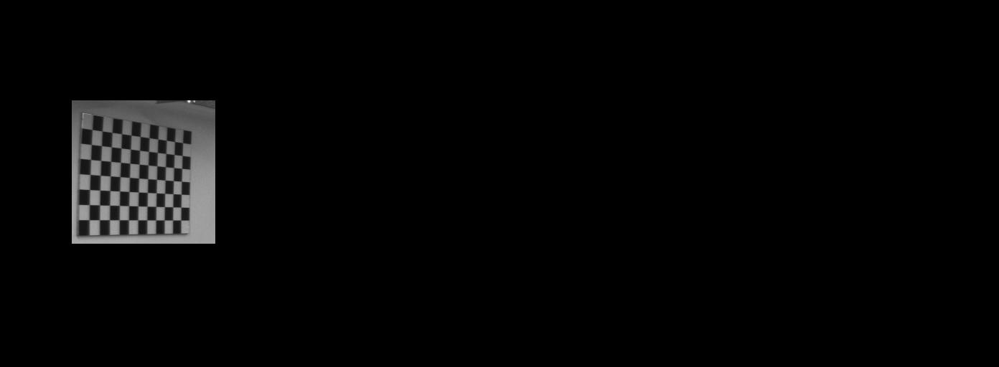

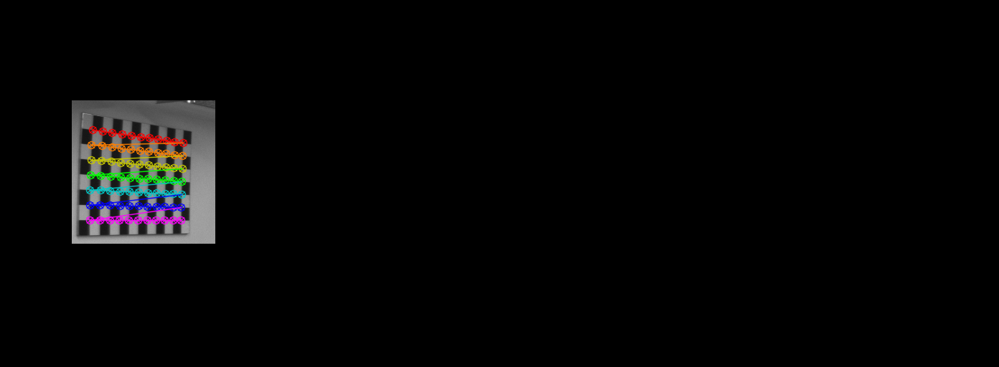

Chessboard: 2


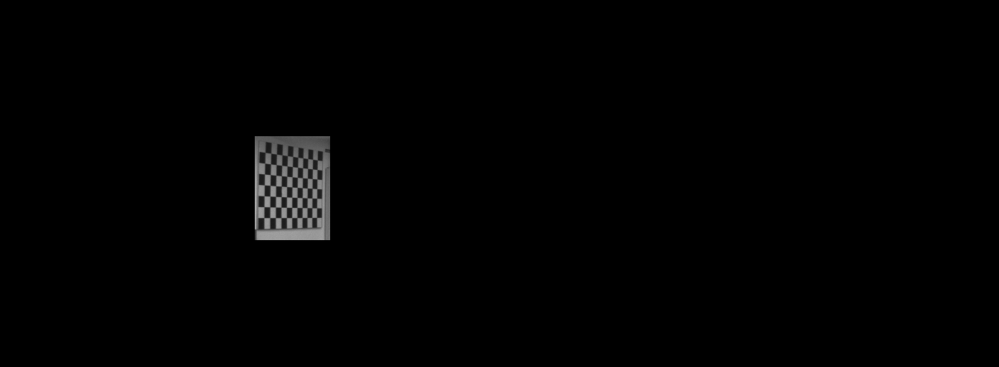

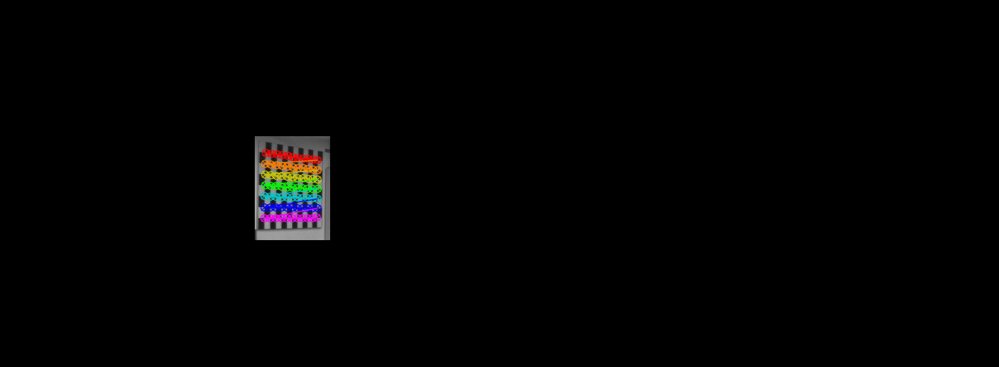

Chessboard: 3


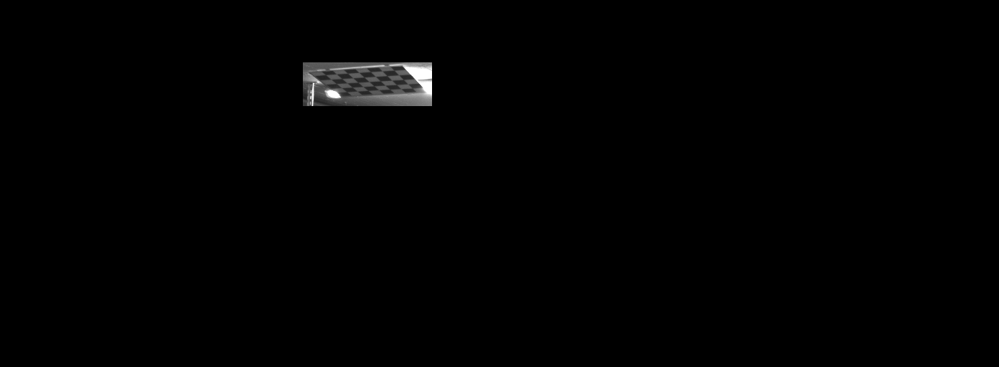

Chessboard: 4


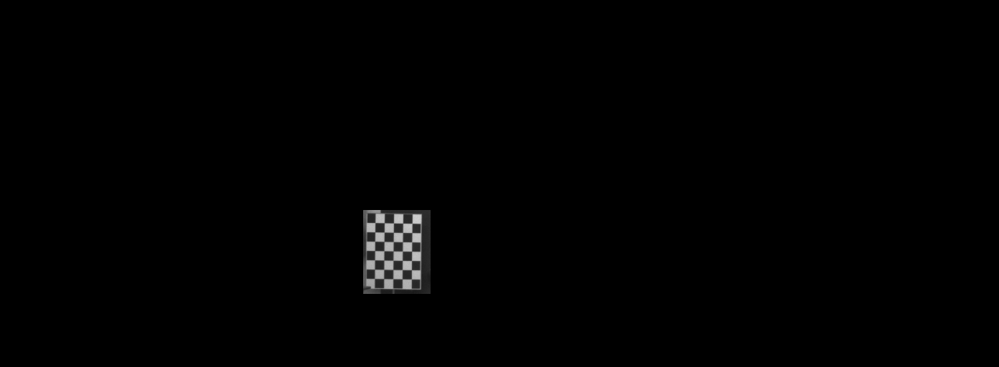

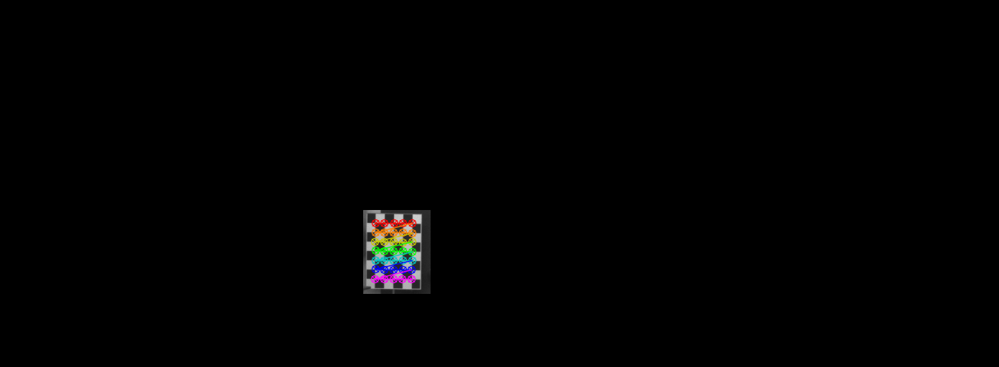

Chessboard: 5


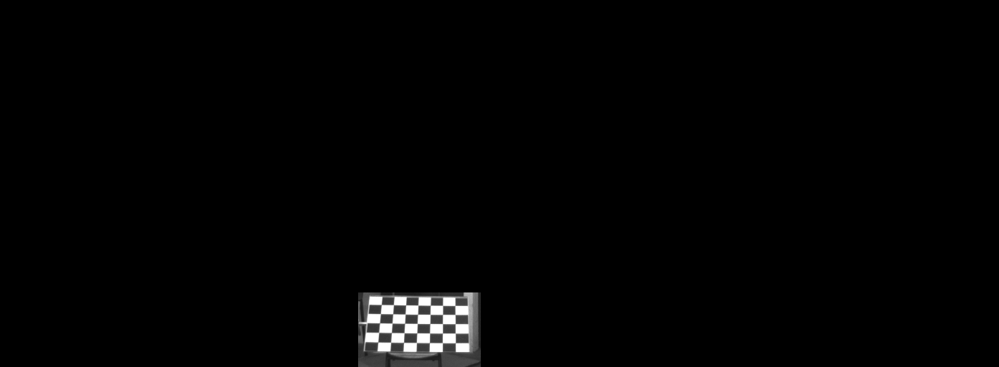

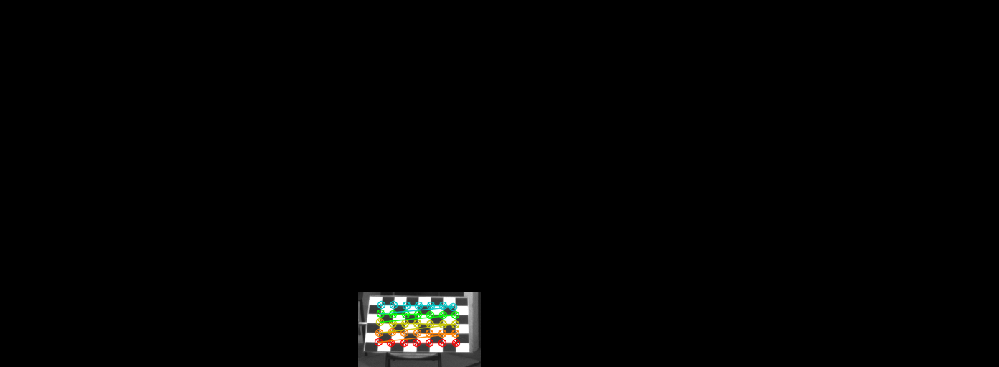

Chessboard: 6


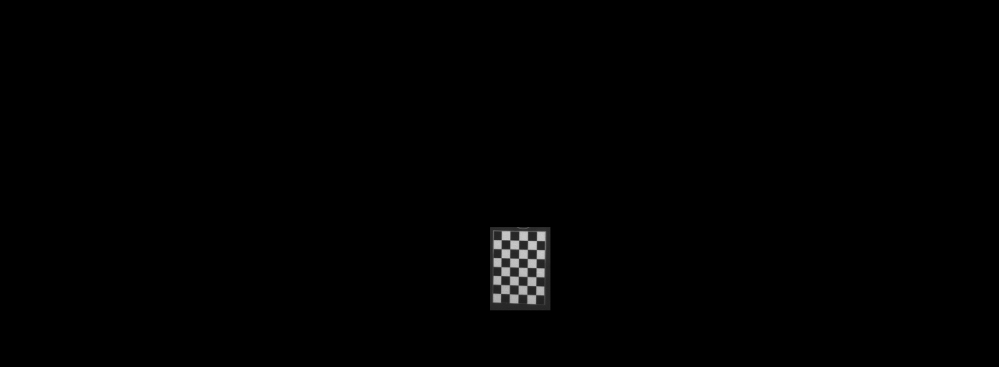

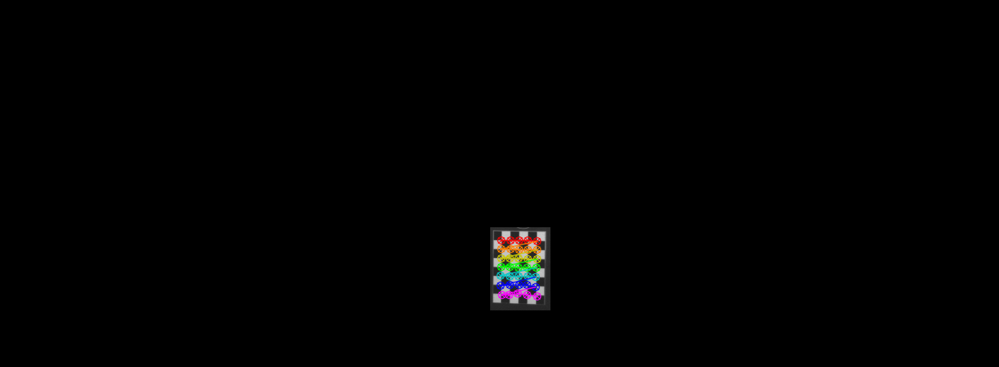

Chessboard: 7


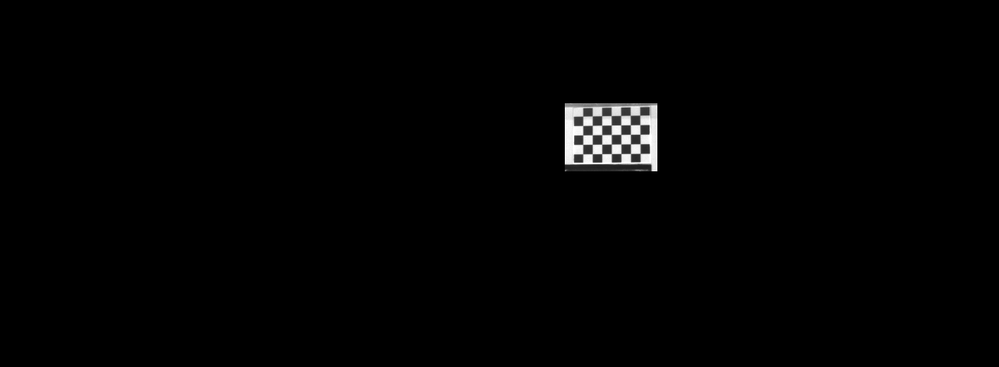

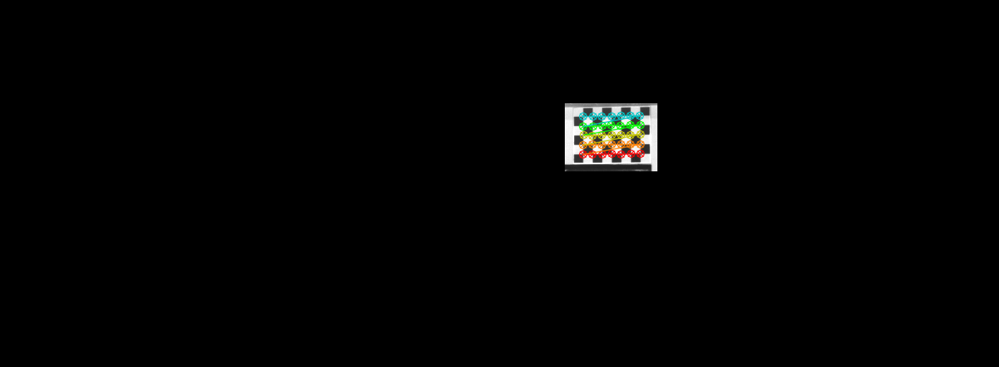

Chessboard: 8


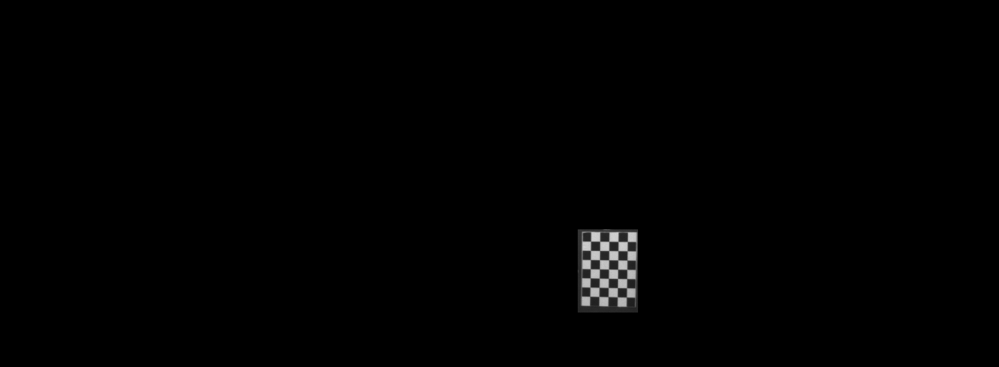

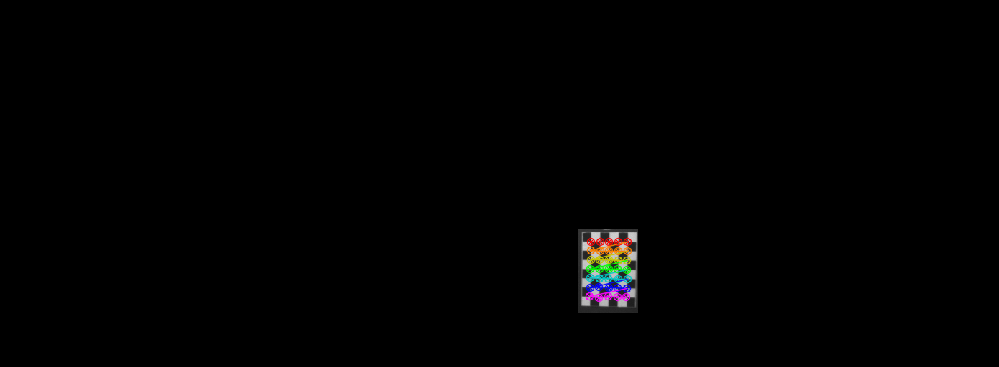

Chessboard: 9


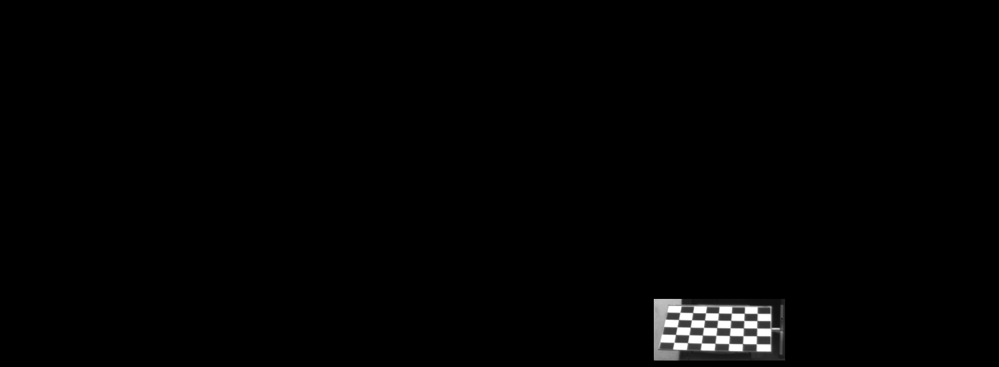

Chessboard: 10


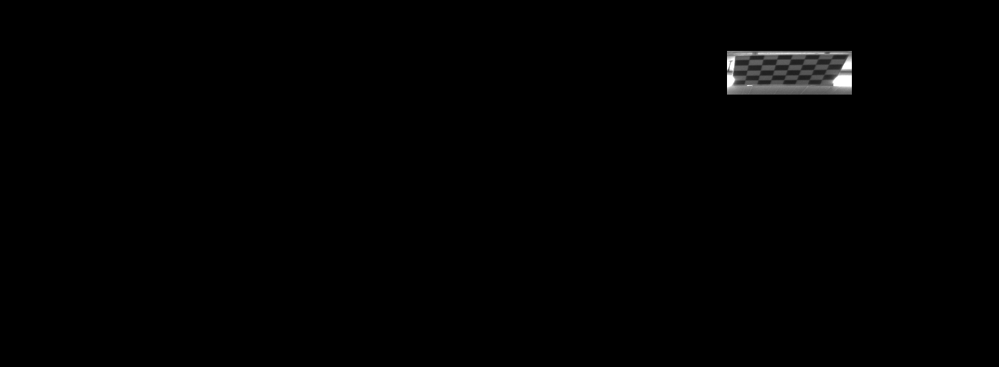

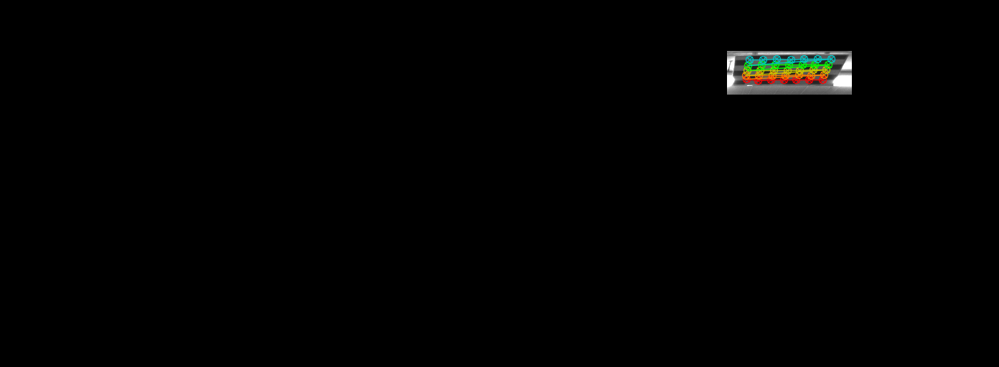

Chessboard: 11


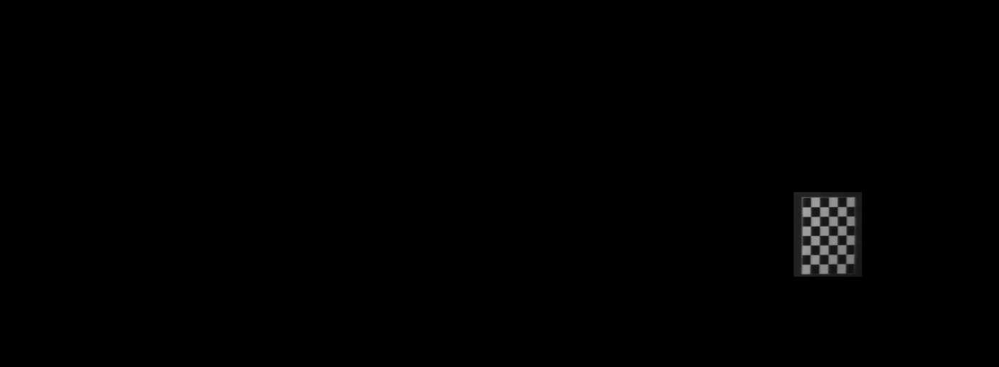

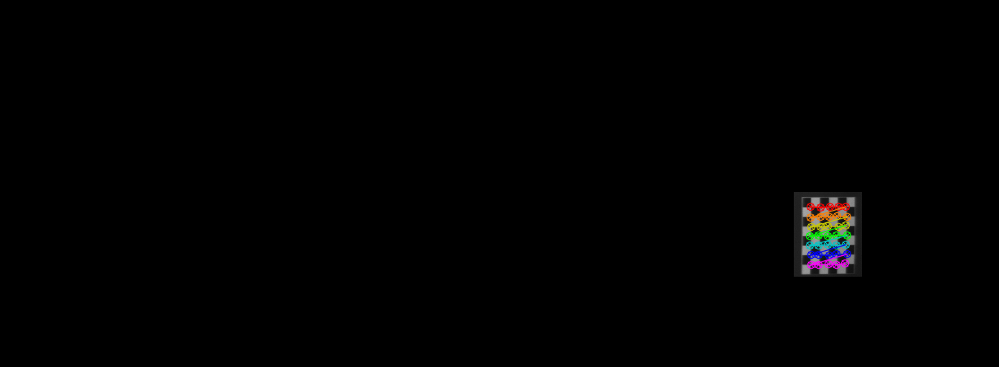

Chessboard: 12


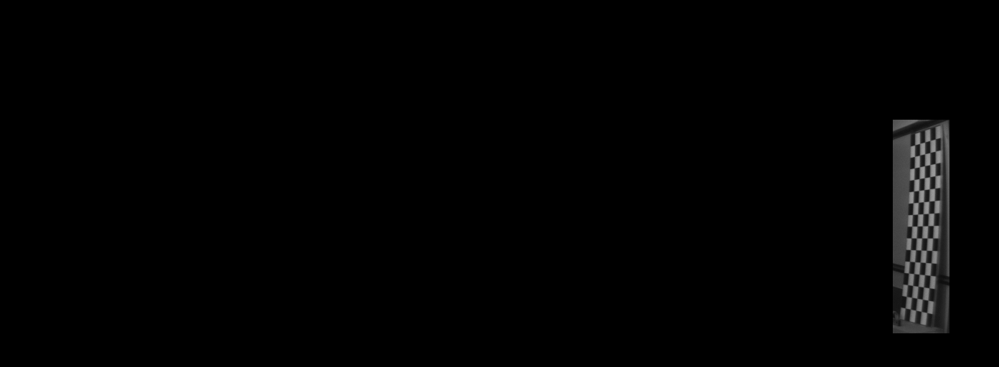

Chessboard: 13


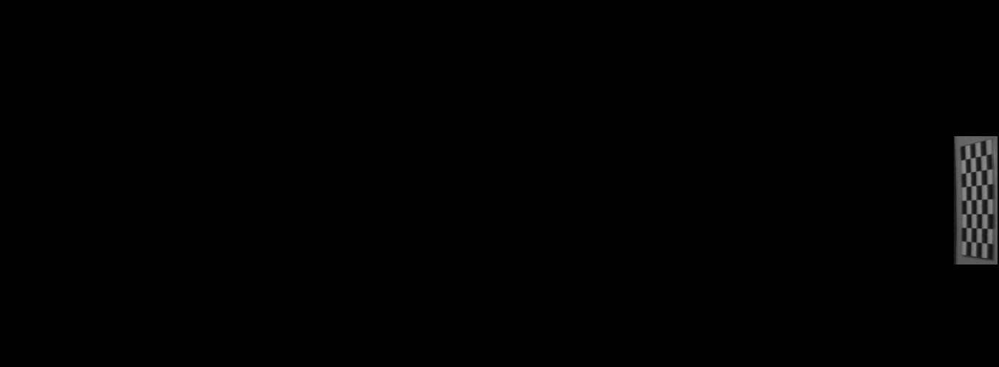

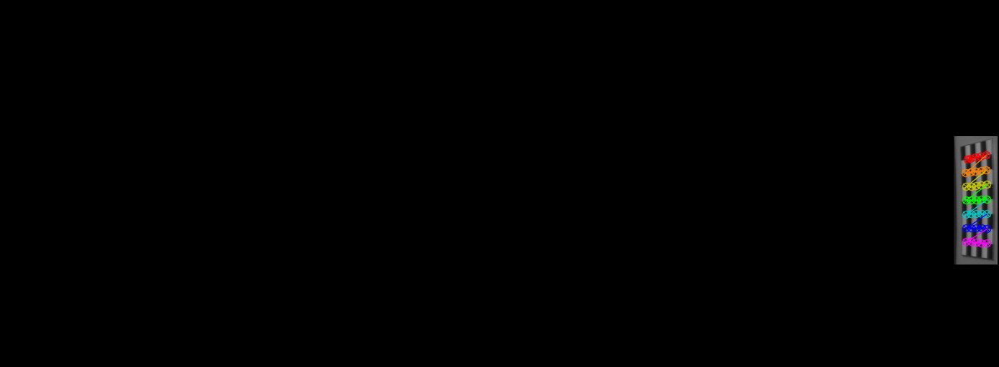

time: 4 s (started: 2021-02-23 16:59:14 +00:00)


In [ ]:
#N. Chessboards: 1  , 2  , 3  , 4  , 5  , 6  , 7  , 8  , 9  , 10  , 11  , 12  , 13 
Pto_Inicio_X =  [100, 355, 422, 506, 499, 683, 787, 805, 911, 1013, 1106, 1244, 1329]
Pto_Inicio_Y =  [140, 190, 87 , 293, 408, 317, 144, 320, 417, 71  , 268 , 167 , 190 ]
Window_Size_X = [200, 105, 180, 94 , 171, 84 , 129, 84 , 183, 174 , 95  , 79  , 61  ]
Window_Size_Y = [200, 145, 61 , 117, 108, 116, 95 , 116, 86 , 61  , 118 , 298 , 179 ]
Inside_Corners_X = [11, 11, 7 , 5, 7, 5, 7, 5, 7, 7, 5, 5, 5]
Inside_Corners_Y = [7,  7 , 5 , 7, 5, 7, 5, 7, 5, 5, 7, 15, 7]
Objpoints_00, Imgpoints_00, Img_gray_00 = Generador_Puntos_Calibr(Pto_Inicio_X, Pto_Inicio_Y, Window_Size_X, Window_Size_Y, Inside_Corners_X, Inside_Corners_Y, '00')

Se logró detectar 10 intersecciones de los tableros entre los 13 tableros presentes. Estos principalmente se dieron para tableros con una forma recta y con poca inclinación vertical.

Con respecto a la relevancia de los tableros de ajedrez para este procedimiento, estos proveen una alta **precisión** en la calibración, debido a que es posible obtener características de las lineas utilizando las intersecciones de las rectas; por otra parte, mediante las rectas, es posible *extrapolar los puntos de interés en un tablero si este no se ve completamente* utilizando la ecuación de la recta, ofreciendo una calibración **robusta**. Por último, son un método de calibración **facil de implementar** debido a la sencillez de los patrones establecidos. Si bien es posible implementar la calibración de las cámaras utilizando otros patrones, las características de los tableros de ajedrez conllevan a que se use de manera transversal en el ámbito de calibración de cámaras.

Se calibra la cámara con la información de los checkerboard detectados, obteniendo los siguentes valores:



*   Ret: Error de reproyección promedio (RMSE)
*   Mtx: Matriz de parámetros intrínsecos de la cámara
*   Dist: Coeficientes de distorsión
*   Rvecs, Tvecs: Posición de la cámara expresado en vectores de rotación y traslación.


In [ ]:
ret_00, mtx_00, dist_00, rvecs_00, tvecs_00 = cv2.calibrateCamera(Objpoints_00, Imgpoints_00, Img_gray_00.shape[::-1], None, None)

time: 403 ms (started: 2021-02-23 16:59:18 +00:00)


#### Cámara 01

Chessboard: 1


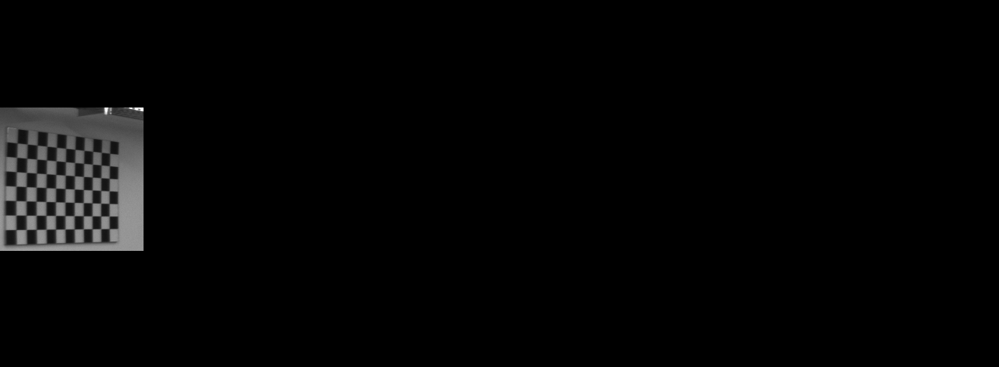

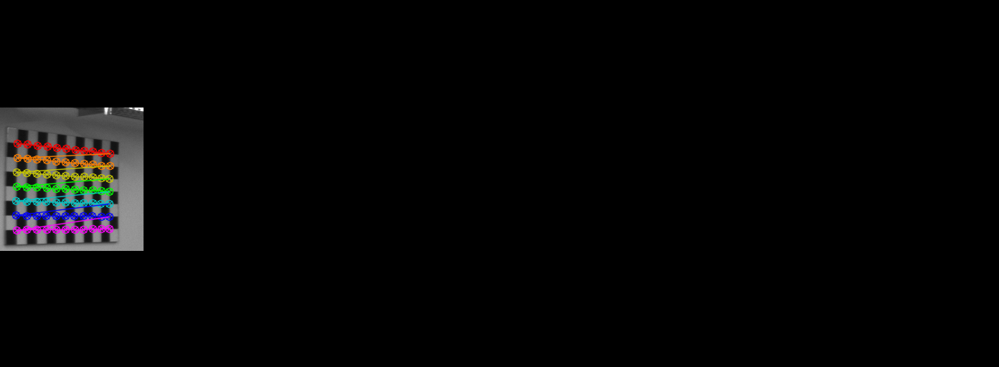

Chessboard: 2


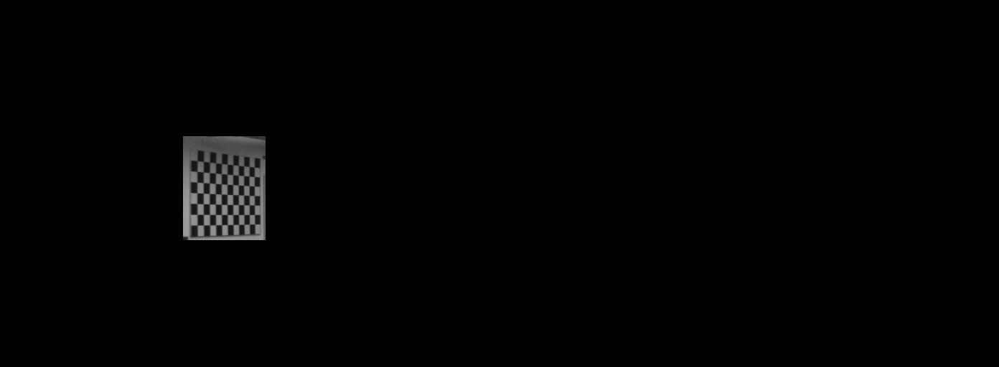

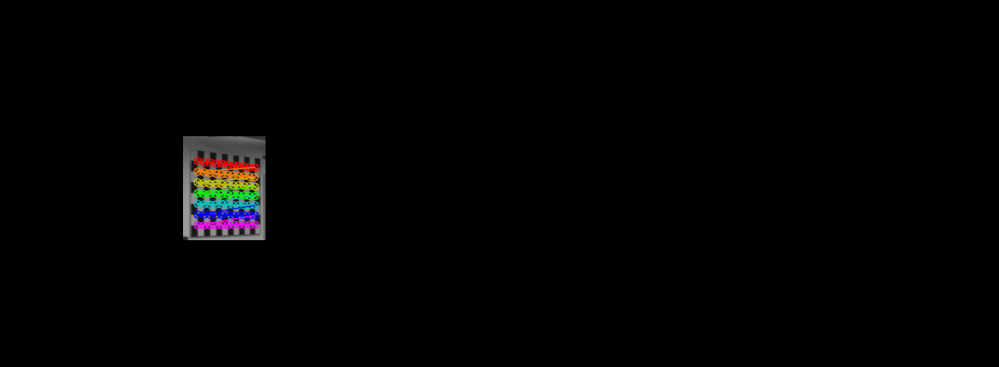

Chessboard: 3


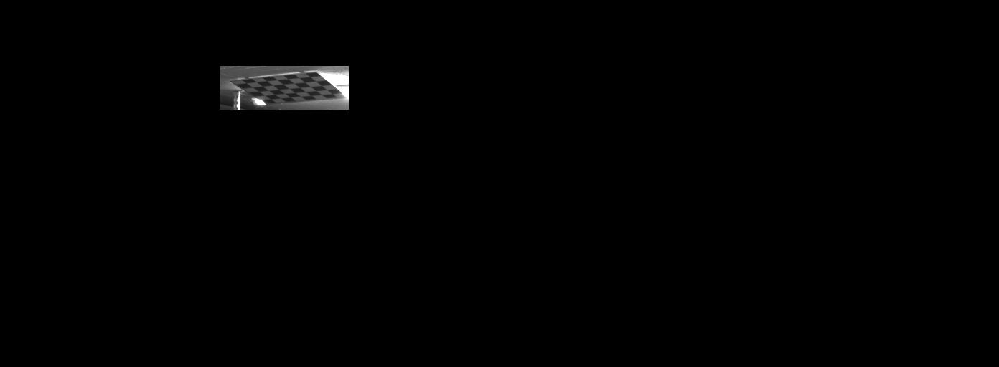

Chessboard: 4


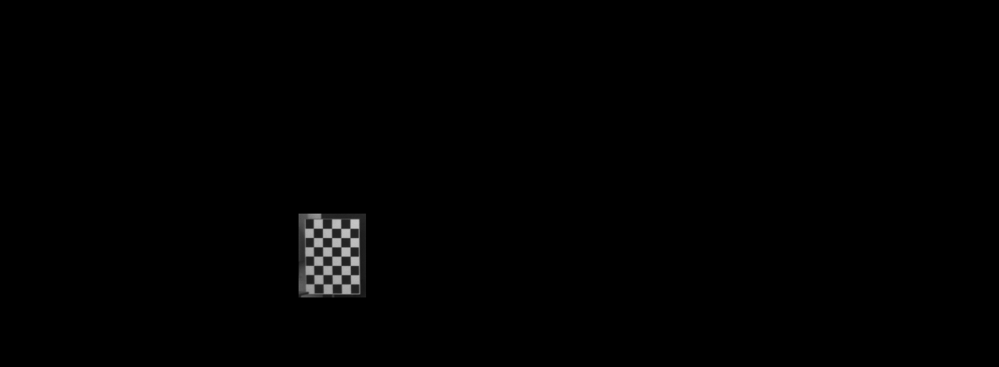

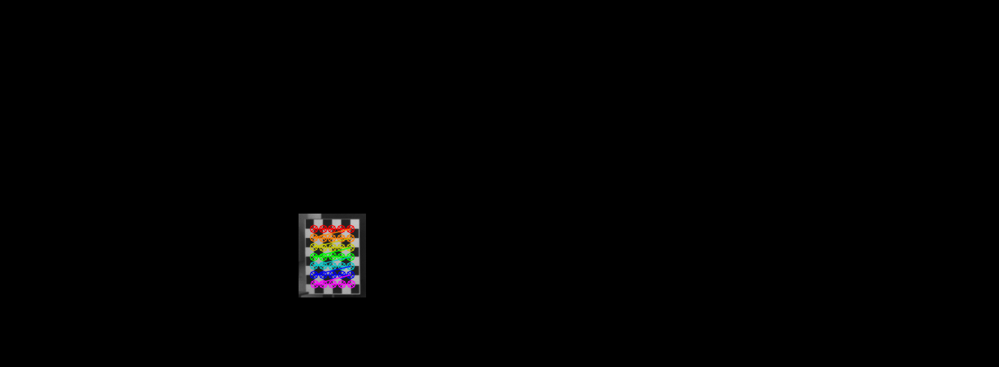

Chessboard: 5


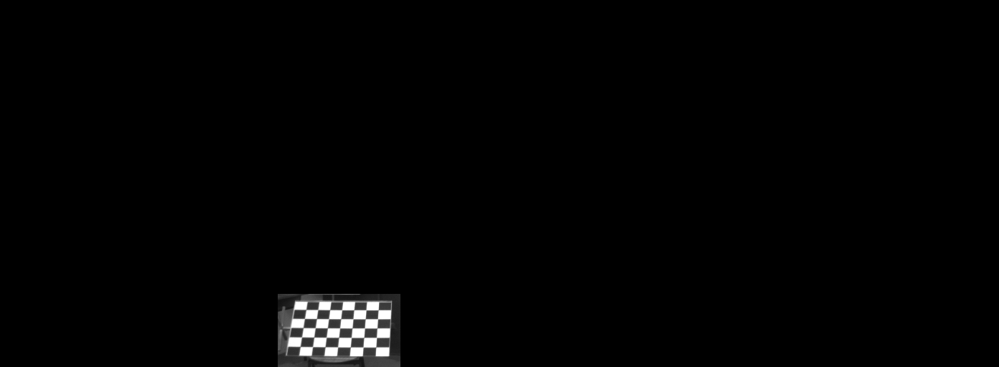

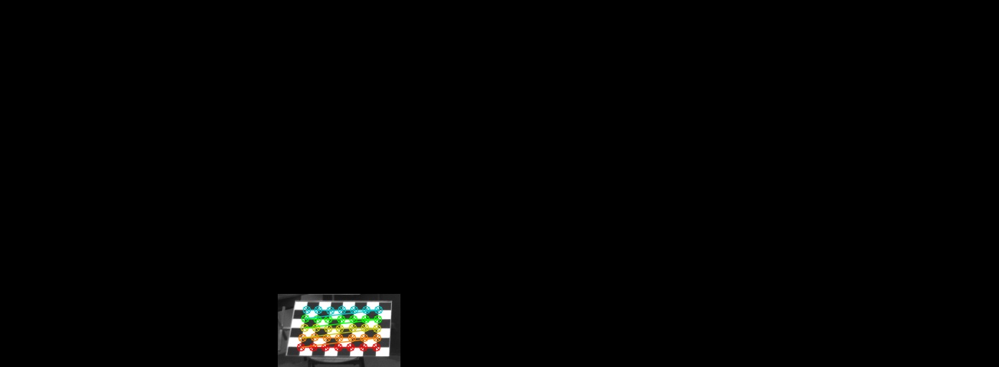

Chessboard: 6


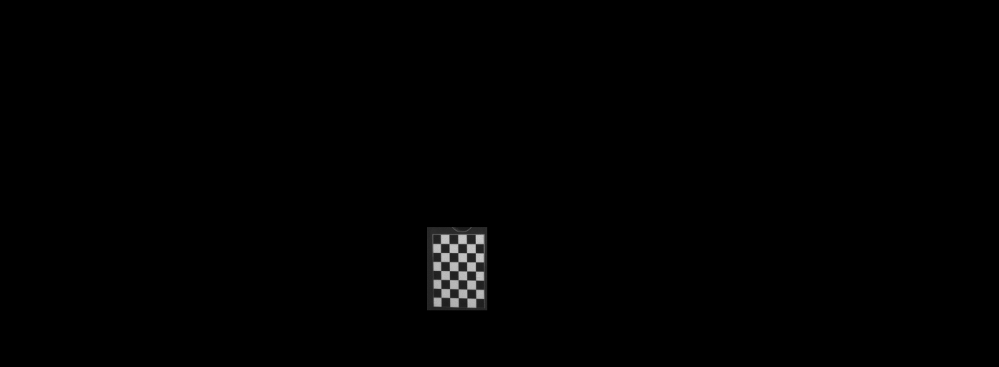

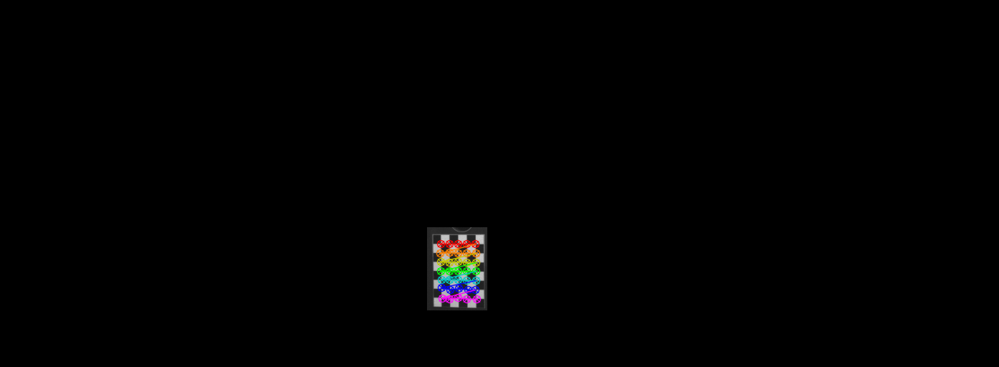

Chessboard: 7


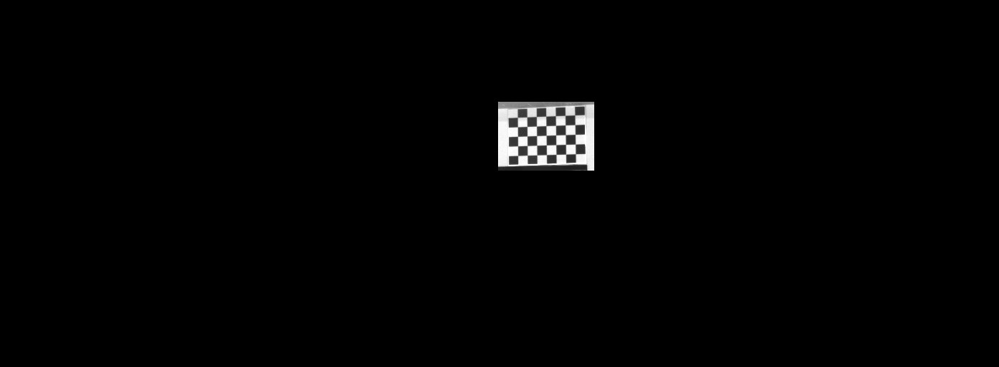

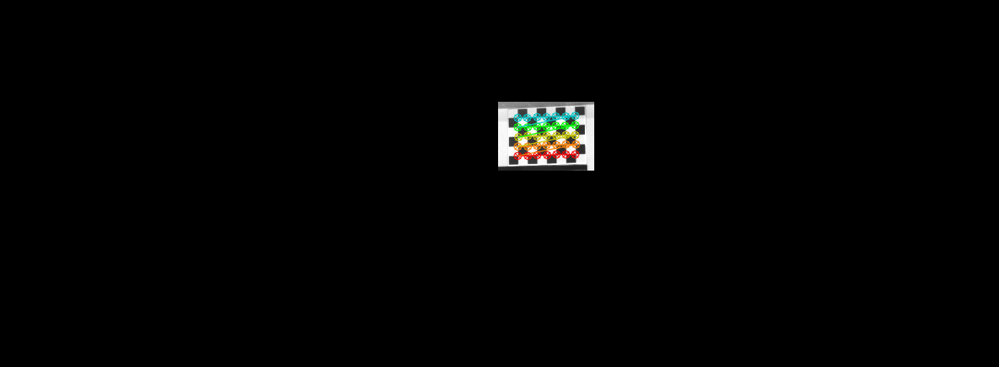

Chessboard: 8


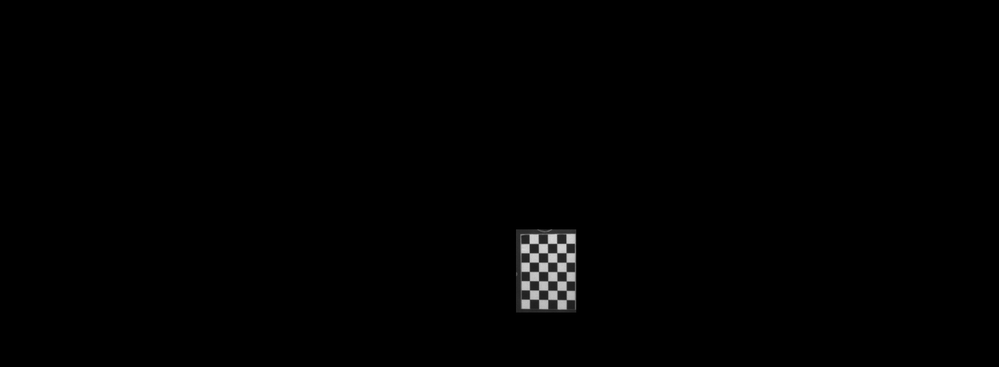

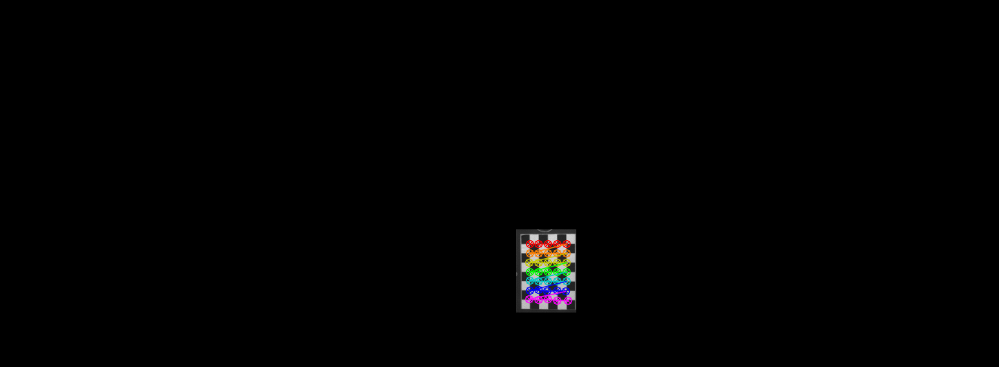

Chessboard: 9


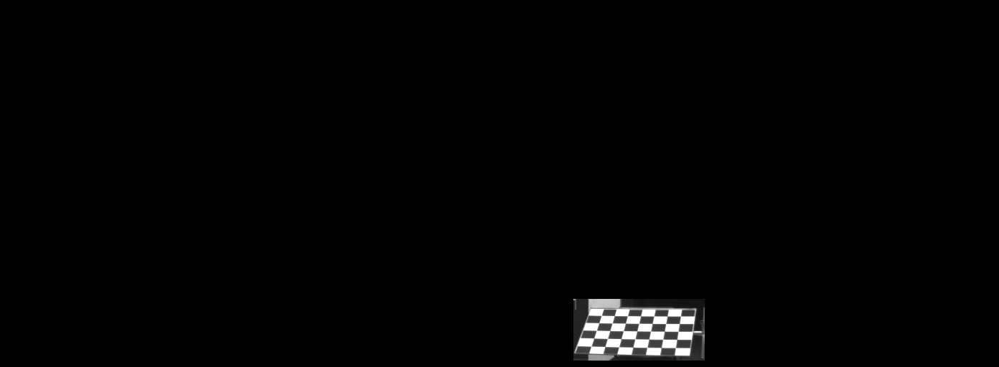

Chessboard: 10


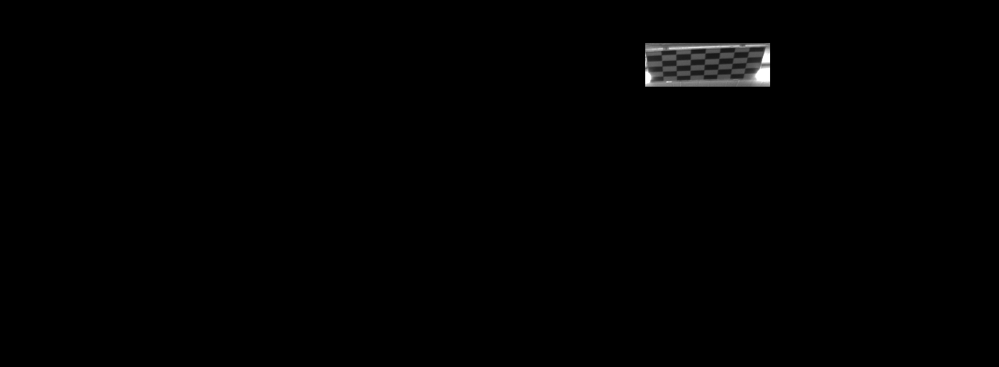

Chessboard: 11


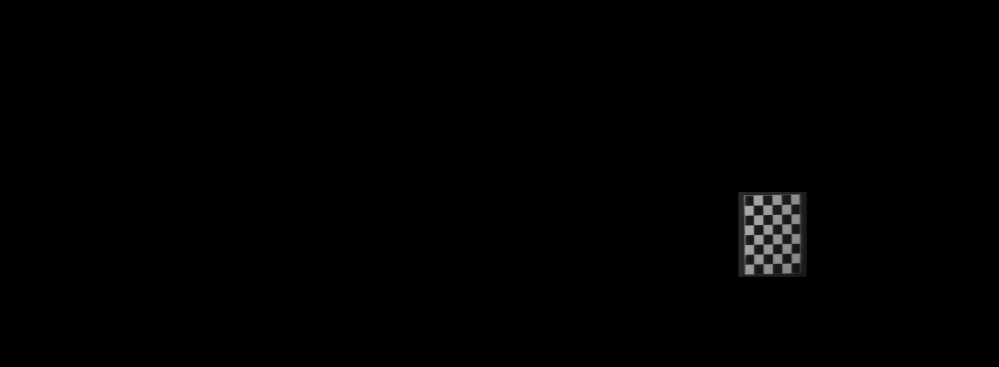

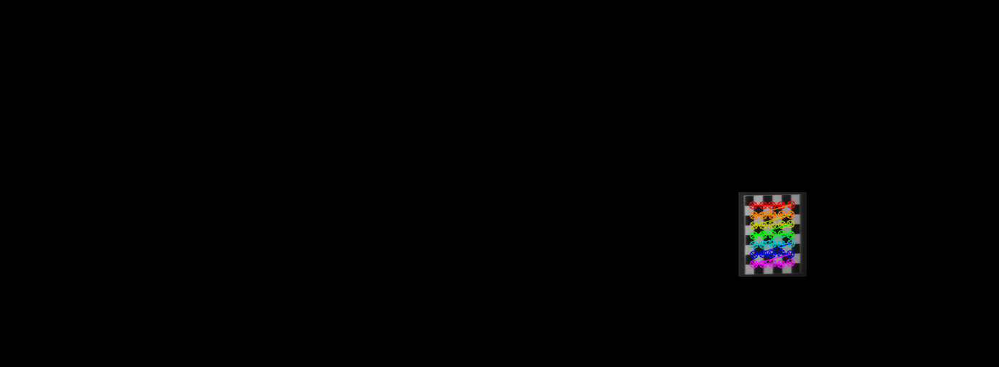

Chessboard: 12


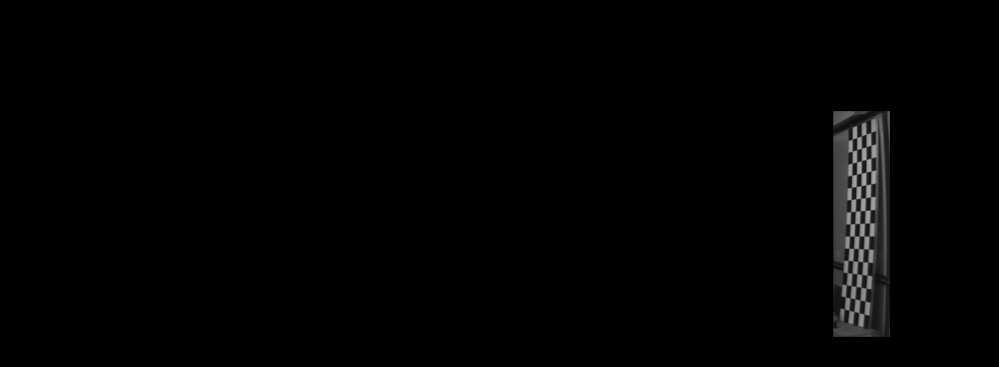

Chessboard: 13


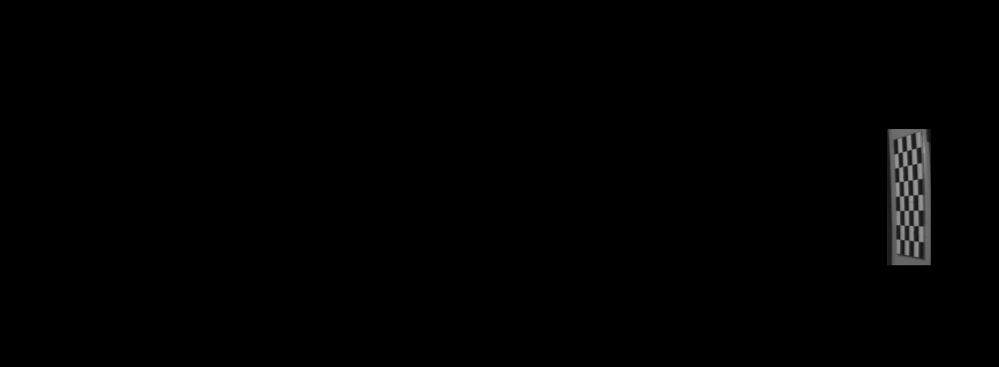

time: 2.69 s (started: 2021-02-23 16:59:18 +00:00)


In [ ]:
# --N. Chessboards: 1  , 2  , 3  , 4  , 5  , 6  , 7  , 8  , 9  , 10  , 11  , 12  , 13 
Pto_Inicio_X_01 =  [0  , 255, 306, 416, 387, 595, 694, 719, 799, 899, 1029, 1161, 1236]
Pto_Inicio_Y_01 =  [150, 190, 92 , 298, 410, 317, 142, 320, 417, 60  , 268 , 155 , 180 ]
Window_Size_X_01 = [200, 115, 180, 94 , 171, 84 , 134, 84 , 183, 174 , 95  , 79  , 61  ]
Window_Size_Y_01 = [200, 145, 61 , 117, 106, 116, 96 , 116, 86 , 61  , 118 , 315 , 190 ]
Inside_Corners_X_01 = [11, 11, 7 , 5, 7, 5, 7,5, 7, 7, 5, 5, 5]
Inside_Corners_Y_01 = [7 ,  7, 5 , 7, 5, 7, 5,7, 5, 5, 7, 15, 7]
Objpoints_01, Imgpoints_01, Img_gray_01 = Generador_Puntos_Calibr(Pto_Inicio_X_01, Pto_Inicio_Y_01, Window_Size_X_01, Window_Size_Y_01, Inside_Corners_X_01, Inside_Corners_Y_01, '01')

Se logró detectar 8 intersecciones de los tableros entre los 13 tableros presentes. Estos principalmente se dieron para tableros con una forma recta y con poca inclinación vertical.

In [ ]:
ret_01, mtx_01, dist_01, rvecs_01, tvecs_01 = cv2.calibrateCamera(Objpoints_01, Imgpoints_01, Img_gray_01.shape[::-1], None, None)

time: 232 ms (started: 2021-02-23 16:59:21 +00:00)


#### Cámara 02

In [ ]:
# --N. Chessboards: 1  , 2  , 3  , 4  , 5  , 6  , 7  , 8  , 9  , 10  , 11  , 12  , 13 
Pto_Inicio_X_02 =  [122, 367, 441, 518, 516, 687, 798, 809, 915, 1017, 1108, 1237, 1322]
Pto_Inicio_Y_02 =  [137, 172, 70 , 274, 389, 300, 131, 301, 401, 61  , 255 , 166 , 180 ]
Window_Size_X_02 = [200, 115, 180, 94 , 171, 84 , 134, 84 , 183, 174 , 95  , 79  , 61  ]
Window_Size_Y_02 = [200, 145, 61 , 117, 106, 116, 96 , 116, 86 , 61  , 118 , 315 , 190 ]
Inside_Corners_X_02 = [11, 11, 7 , 5, 7, 5, 7,5, 7, 7, 5, 5, 5]
Inside_Corners_Y_02 = [7 ,  7, 5 , 7, 5, 7, 5,7, 5, 5, 7, 15, 7]
Objpoints_02, Imgpoints_02, Image_Gris_02 = Generador_Puntos_Calibr(Pto_Inicio_X_02, Pto_Inicio_Y_02, Window_Size_X_02, Window_Size_Y_02, Inside_Corners_X_02, Inside_Corners_Y_02, '02', False, False)

time: 1.8 s (started: 2021-02-23 16:59:21 +00:00)


In [ ]:
ret_02, mtx_02, dist_02, rvecs_02, tvecs_02 = cv2.calibrateCamera(Objpoints_02, Imgpoints_02, Image_Gris_02.shape[::-1], None, None)

time: 292 ms (started: 2021-02-23 16:59:23 +00:00)


#### Cámara 03

In [ ]:
# --N. Chessboards: 1  , 2  , 3  , 4  , 5  , 6  , 7  , 8  , 9  , 10  , 11  , 12  , 13 
Pto_Inicio_X_03 =  [69 , 303, 351, 433, 450, 611, 725, 709, 803, 887, 1006, 1126, 1202]
Pto_Inicio_Y_03 =  [158, 186, 95 , 381, 279, 297, 298, 138, 395, 58  , 245 , 144 , 172 ]
Window_Size_X_03 = [200, 115, 173, 144, 80, 78  , 80 , 113, 156, 168 , 91  , 69  , 50  ]
Window_Size_Y_03 = [200, 145, 48 , 90 ,105, 110 , 108, 80 , 79 , 59  , 121 , 300 , 168 ]
Inside_Corners_X_03 = [11, 11, 7 , 5  , 7 , 5   , 7  , 5  , 7  , 7   , 5   , 5   , 5   ]
Inside_Corners_Y_03 = [7 ,  7, 5 , 7  , 5 , 7   , 5  , 7  , 5  , 5   , 7   , 15  , 7   ]
Objpoints_03, Imgpoints_03, Image_Gris_03 = Generador_Puntos_Calibr(Pto_Inicio_X_03, Pto_Inicio_Y_03, Window_Size_X_03, Window_Size_Y_03, Inside_Corners_X_03, Inside_Corners_Y_03, '03', False, False)

time: 1.96 s (started: 2021-02-23 16:59:24 +00:00)


In [ ]:
ret_03, mtx_03, dist_03, rvecs_03, tvecs_03 = cv2.calibrateCamera(Objpoints_03, Imgpoints_03, Image_Gris_03.shape[::-1], None, None)

time: 164 ms (started: 2021-02-23 16:59:25 +00:00)


#### Ground Truth de los datos de la calibración y medición de error

Se tiene a continuación los valores provienientes del archivo "calib_cam_to_cam.txt", los cuales son los valores "ground-truth" tanto para la matriz de parámetros intrínsecos como para los coeficientes de distorsión y matrices de rotación y traslación de la cámara 0 a la cámara i, con i entre 0 a 3.

In [ ]:
GT_mtx_00 = np.array([[9.842439e+02, 0.000000e+00, 6.900000e+02],
                      [0.000000e+00, 9.808141e+02, 2.331966e+02],
                      [0.000000e+00, 0.000000e+00, 1.000000e+00]])
GT_dist_00 = np.array([[-3.728755e-01, 2.037299e-01, 2.219027e-03, 1.383707e-03, -7.233722e-02]])
GT_mtx_01 = np.array([[9.842439e+02, 0.000000e+00, 6.900000e+02],
                      [0.000000e+00, 9.808141e+02, 2.331966e+02],
                      [0.000000e+00, 0.000000e+00, 1.000000e+00]])
GT_dist_01 = np.array([[-3.644661e-01, 1.790019e-01, 1.148107e-03, -6.298563e-04, -5.314062e-02]])
GT_mtx_02 = np.array([[9.597910e+02, 0.000000e+00, 6.960217e+02],
                      [0.000000e+00, 9.569251e+02, 2.241806e+02],
                      [0.000000e+00, 0.000000e+00, 1.000000e+00]])
GT_dist_02 = np.array([[-3.691481e-01, 1.968681e-01, 1.353473e-03, 5.677587e-04, -6.770705e-02]])
GT_mtx_03 = np.array([[9.037596e+02, 0.000000e+00, 6.957519e+02],
                      [0.000000e+00, 9.019653e+02, 2.242509e+02],
                      [0.000000e+00, 0.000000e+00, 1.000000e+00]])
GT_dist_03 = np.array([[-3.639558e-01, 1.788651e-01, 6.029694e-04, -3.922424e-04, -5.382460e-02]])

time: 9.14 ms (started: 2021-02-23 16:59:26 +00:00)


In [ ]:
GT_Rot_01 = np.array([[9.993513e-01 ,1.860866e-02, -3.083487e-02],
                      [-1.887662e-02, 9.997863e-01, -8.421873e-03],
                      [3.067156e-02, 8.998467e-03, 9.994890e-01]])
GT_Trl_01 = np.array([-5.370000e-01,4.822061e-03, -1.252488e-02])

time: 3.17 ms (started: 2021-02-23 22:27:04 +00:00)


Se presenta a continuación las matrices de parámetros intrínsecos por defecto:

In [ ]:
print('Matriz de parámetros intrínsecos por defecto para la cámara 00:')
print(GT_mtx_00)
print('Matriz de parámetros intrínsecos por defecto para la cámara 01:')
print(GT_mtx_01)
print('Matriz de parámetros intrínsecos por defecto para la cámara 02:')
print(GT_mtx_02)
print('Matriz de parámetros intrínsecos por defecto para la cámara 03:')
print(GT_mtx_03)

Matriz de parámetros intrínsecos por defecto para la cámara 00:
[[984.2439   0.     690.    ]
 [  0.     980.8141 233.1966]
 [  0.       0.       1.    ]]
Matriz de parámetros intrínsecos por defecto para la cámara 01:
[[984.2439   0.     690.    ]
 [  0.     980.8141 233.1966]
 [  0.       0.       1.    ]]
Matriz de parámetros intrínsecos por defecto para la cámara 02:
[[959.791    0.     696.0217]
 [  0.     956.9251 224.1806]
 [  0.       0.       1.    ]]
Matriz de parámetros intrínsecos por defecto para la cámara 03:
[[903.7596   0.     695.7519]
 [  0.     901.9653 224.2509]
 [  0.       0.       1.    ]]
time: 8.54 ms (started: 2021-02-23 16:59:26 +00:00)


Se presenta a continuación las matrices de parámetros intrínsecos calculadas:

In [ ]:
print('Matriz de parámetros intrínsecos para la cámara 00:')
print(mtx_00)
print('Matriz de parámetros intrínsecos para la cámara 01:')
print(mtx_01)
print('Matriz de parámetros intrínsecos para la cámara 02:')
print(mtx_02)
print('Matriz de parámetros intrínsecos para la cámara 03:')
print(mtx_03)

Matriz de parámetros intrínsecos para la cámara 00:
[[1.01790458e+03 0.00000000e+00 6.95714976e+02]
 [0.00000000e+00 1.03174019e+03 2.49095140e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Matriz de parámetros intrínsecos para la cámara 01:
[[1.32249457e+03 0.00000000e+00 6.95155493e+02]
 [0.00000000e+00 1.22977801e+03 2.55347087e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Matriz de parámetros intrínsecos para la cámara 02:
[[9.84068039e+02 0.00000000e+00 6.97826930e+02]
 [0.00000000e+00 1.01435815e+03 2.52647794e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Matriz de parámetros intrínsecos para la cámara 03:
[[1.27067975e+03 0.00000000e+00 7.02592071e+02]
 [0.00000000e+00 1.16885392e+03 2.60760531e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
time: 8.15 ms (started: 2021-02-23 16:59:26 +00:00)


Se procede a comparar las matrices de parámetros intrínsecos obtenidas con las matrices por defecto del dataset, utilizando MSE (Mean Square Error) para determinar la desviación de los valores. Se utilizó esta métrica debido a que penaliza más si se presenta una desviación importante de los valores, permitiendo observar si la diferencia entre los valores en general de la matriz calculada difieren en exceso con la matriz por defecto.

In [ ]:
mse_00 = (np.square(GT_mtx_00 - mtx_00)).mean(axis=None)
mse_01 = (np.square(GT_mtx_01 - mtx_01)).mean(axis=None)
mse_02 = (np.square(GT_mtx_02 - mtx_02)).mean(axis=None)
mse_03 = (np.square(GT_mtx_03 - mtx_03)).mean(axis=None)
print('MSE para la cámara 00: ', mse_00)
print('MSE para la cámara 01: ', mse_01)
print('MSE para la cámara 02: ', mse_02)
print('MSE para la cámara 03: ', mse_03)

MSE para la cámara 00:  445.7702339104826
MSE para la cámara 01:  19657.085417239537
MSE para la cámara 02:  522.3966327867291
MSE para la cámara 03:  23026.6302039779
time: 8.59 ms (started: 2021-02-23 16:59:26 +00:00)


Se puede apreciar que las matrices calculadas son similares para las cámaras 00 y 02, con valores similares para los largos focales (fx & fy) y el punto principal (cx & cy). Por otra parte, las cámaras 01 y 03 presentan una diferencia más pronunciada en los valores de los largos focales, lo cual se ve reflejado en el aumento del MSE para dichas cámaras.

### Extracción de características

Se extraen las características para cada una de las secuencias utilizando tanto ambos tipos de descriptores (SIFT y ORB) como ambos tipos de emparejadores (BF y FLANN). 

#### Secuencia 0014

In [ ]:
Str_Dir_14 = '2011_09_26/2011_09_26_drive_0014_sync/image_00/data/'
SIFT_BF_Elem_00_14, SIFT_BF_Lista_Kp1_00_14, SIFT_BF_Lista_Kp2_00_14, SIFT_BF_Pts_1_00_14, SIFT_BF_Pts_2_00_14 = Features(Str_Dir_14, 'sift',Str_Matcher_Obj='BF')
ORB_BF_Elem_00_14, ORB_BF_Lista_Kp1_00_14, ORB_BF_Lista_Kp2_00_14,  ORB_BF_Pts_1_00_14,  ORB_BF_Pts_2_00_14 = Features(Str_Dir_14, 'orb',Str_Matcher_Obj='BF')

time: 5min 29s (started: 2021-02-23 01:15:58 +00:00)


In [ ]:
Str_Dir_14 = '2011_09_26/2011_09_26_drive_0014_sync/image_00/data/'
SIFT_FLANN_Elem_00_14, SIFT_FLANN_Lista_Kp1_00_14, SIFT_FLANN_Lista_Kp2_00_14, SIFT_FLANN_Pts_1_00_14, SIFT_FLANN_Pts_2_00_14 = Features(Str_Dir_14, 'sift',Str_Matcher_Obj='FLANN')
ORB_FLANN_Elem_00_14, ORB_FLANN_Lista_Kp1_00_14, ORB_FLANN_Lista_Kp2_00_14, ORB_FLANN_Pts_1_00_14, ORB_FLANN_Pts_2_00_14 = Features(Str_Dir_14, 'orb',Str_Matcher_Obj='FLANN')

time: 3min 50s (started: 2021-02-23 01:21:28 +00:00)


Se compara a continuación los descriptores para cada una de las combinaciones anteriores:

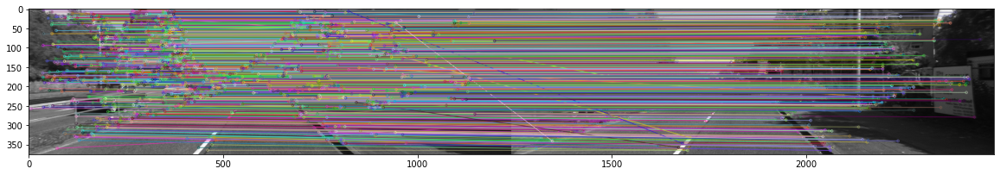

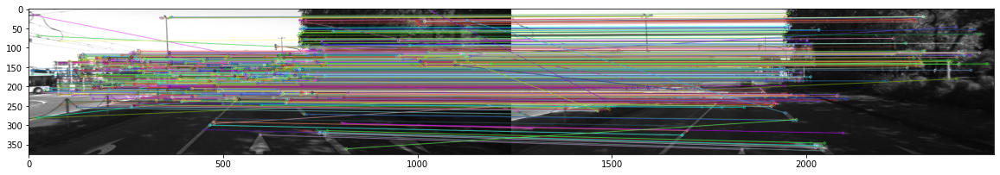

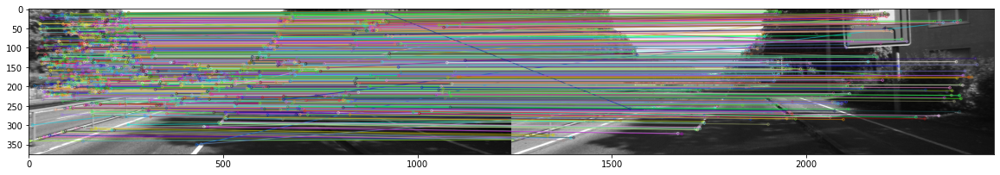

time: 1.56 s (started: 2021-02-23 01:25:18 +00:00)


In [ ]:
Random_Sample_Imgs(Str_Dir_14, SIFT_BF_Elem_00_14, SIFT_BF_Lista_Kp1_00_14, SIFT_BF_Lista_Kp2_00_14, 3)

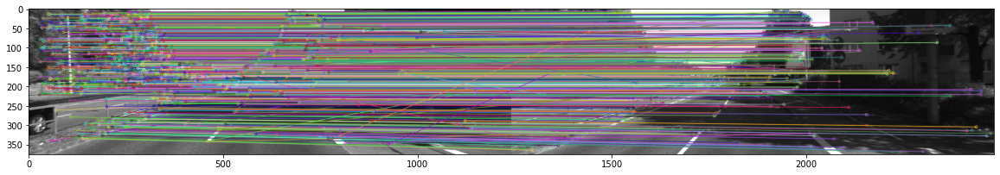

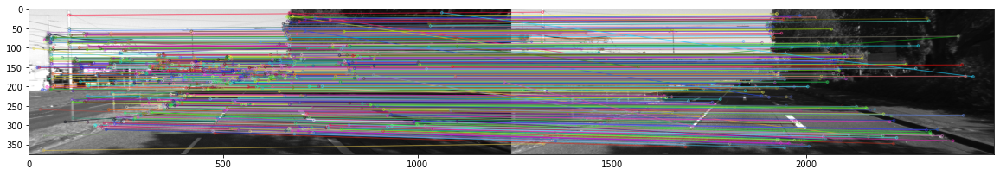

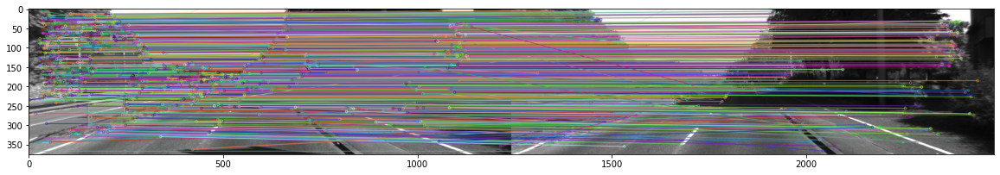

time: 1.67 s (started: 2021-02-23 01:25:20 +00:00)


In [ ]:
Random_Sample_Imgs(Str_Dir_14, SIFT_FLANN_Elem_00_14, SIFT_FLANN_Lista_Kp1_00_14, SIFT_FLANN_Lista_Kp2_00_14, 3)

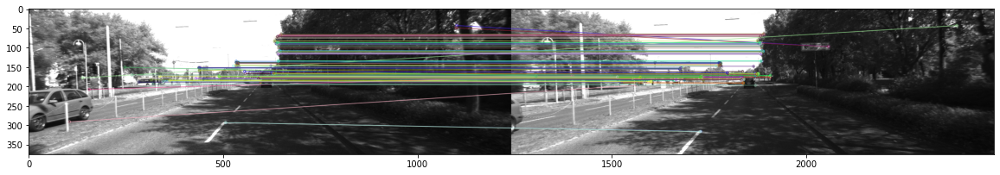

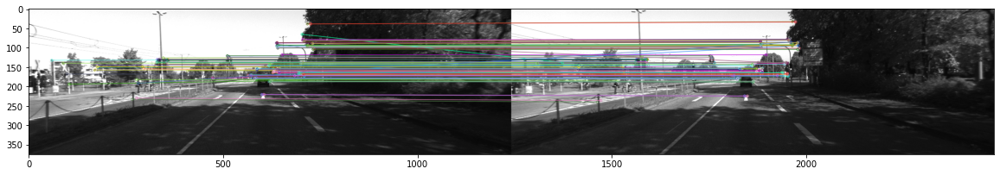

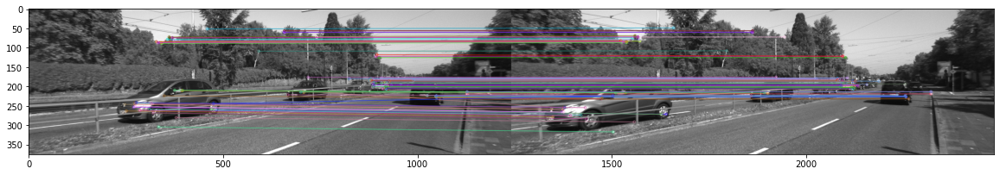

time: 1.46 s (started: 2021-02-23 01:25:21 +00:00)


In [ ]:
Random_Sample_Imgs(Str_Dir_14, ORB_BF_Elem_00_14, ORB_BF_Lista_Kp1_00_14, ORB_BF_Lista_Kp2_00_14, 3)

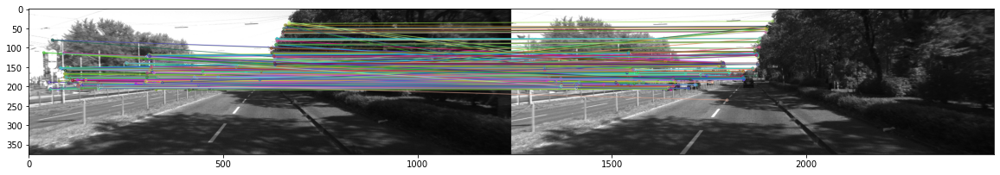

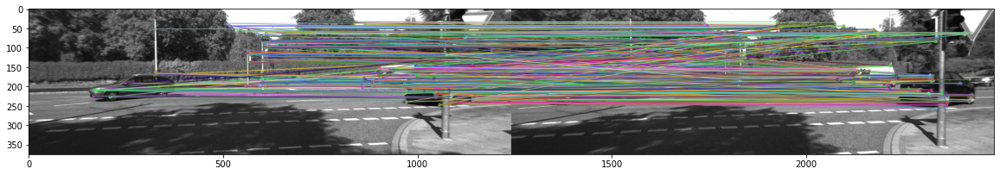

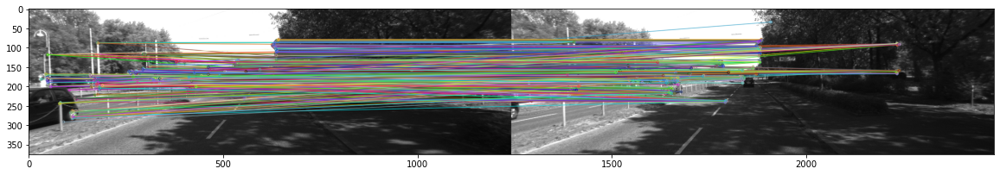

time: 1.65 s (started: 2021-02-23 01:25:23 +00:00)


In [ ]:
Random_Sample_Imgs(Str_Dir_14, ORB_FLANN_Elem_00_14, ORB_FLANN_Lista_Kp1_00_14, ORB_FLANN_Lista_Kp2_00_14, 3)

#### Secuencia 0036

In [ ]:
Str_Dir_36 = '2011_09_26/2011_09_26_drive_0036_sync/image_00/data/'
SIFT_BF_Elem_00_36, SIFT_BF_Lista_Kp1_00_36, SIFT_BF_Lista_Kp2_00_36, SIFT_BF_Pts_1_00_36, SIFT_BF_Pts_2_00_36 = Features(Str_Dir_36, 'sift',Str_Matcher_Obj='BF')
ORB_BF_Elem_00_36, ORB_BF_Lista_Kp1_00_36, ORB_BF_Lista_Kp2_00_36, ORB_BF_Pts_1_00_36, ORB_BF_Pts_2_00_36 = Features(Str_Dir_36,'orb',Str_Matcher_Obj='BF')

time: 15min 11s (started: 2021-02-23 01:25:26 +00:00)


In [ ]:
Str_Dir_36 = '2011_09_26/2011_09_26_drive_0036_sync/image_00/data/'
SIFT_FLANN_Elem_00_36, SIFT_FLANN_Lista_Kp1_00_36, SIFT_FLANN_Lista_Kp2_00_36, SIFT_FLANN_Pts_1_00_36, SIFT_FLANN_Pts_2_00_36 = Features(Str_Dir_36, 'sift',Str_Matcher_Obj='FLANN')
ORB_FLANN_Elem_00_36, ORB_FLANN_Lista_Kp1_00_36, ORB_FLANN_Lista_Kp2_00_36, ORB_FLANN_Pts_1_00_36, ORB_FLANN_Pts_2_00_36 = Features(Str_Dir_36,'orb',Str_Matcher_Obj='FLANN')

time: 10min 17s (started: 2021-02-23 01:40:38 +00:00)


Se compara a continuación los descriptores para cada una de las combinaciones anteriores:

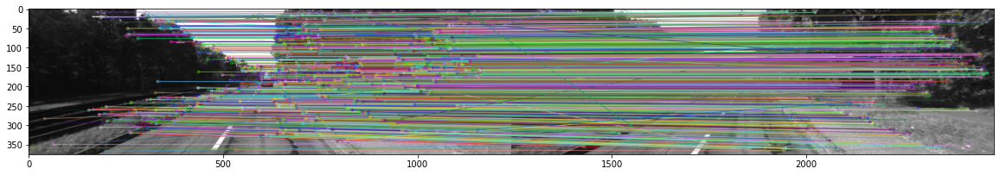

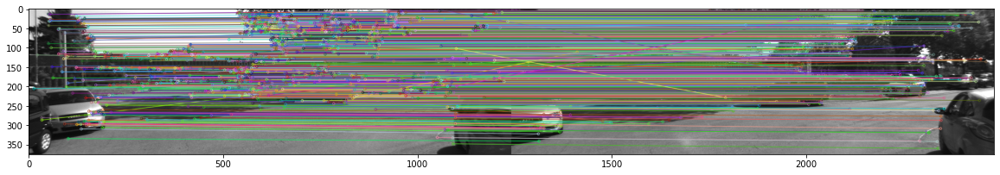

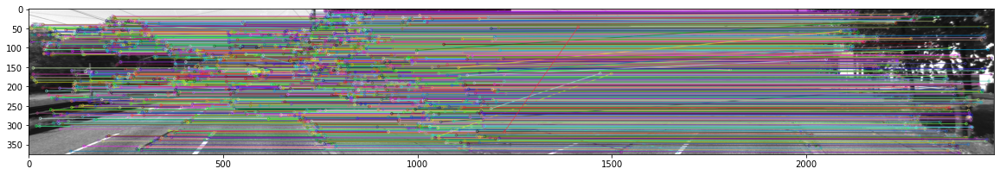

time: 1.41 s (started: 2021-02-21 03:59:25 +00:00)


In [ ]:
Random_Sample_Imgs(Str_Dir_36, SIFT_BF_Elem_00_36, SIFT_BF_Lista_Kp1_00_36, SIFT_BF_Lista_Kp2_00_36, 3)

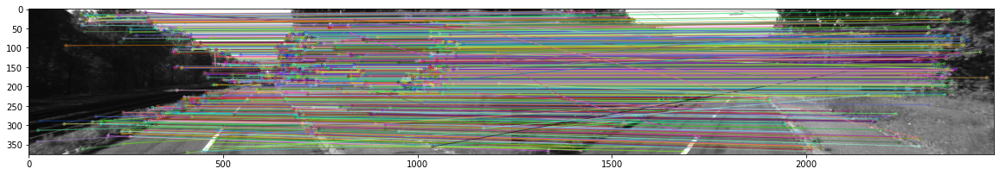

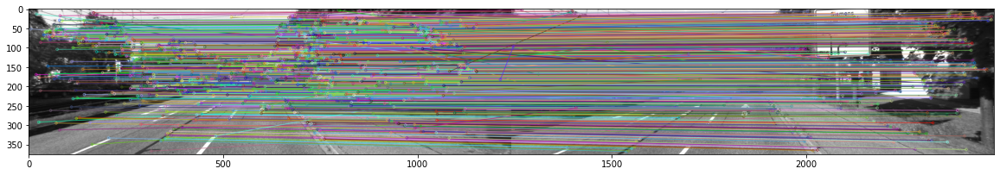

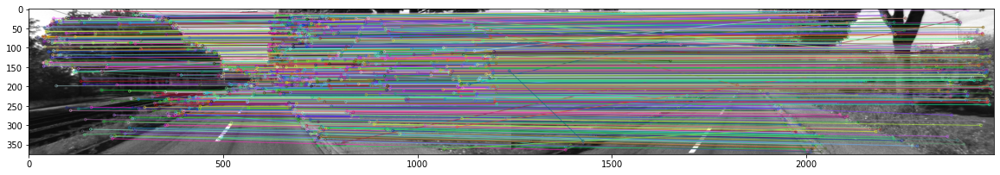

time: 1.49 s (started: 2021-02-21 03:59:26 +00:00)


In [ ]:
Random_Sample_Imgs(Str_Dir_36, SIFT_FLANN_Elem_00_36, SIFT_FLANN_Lista_Kp1_00_36, SIFT_FLANN_Lista_Kp2_00_36, 3)

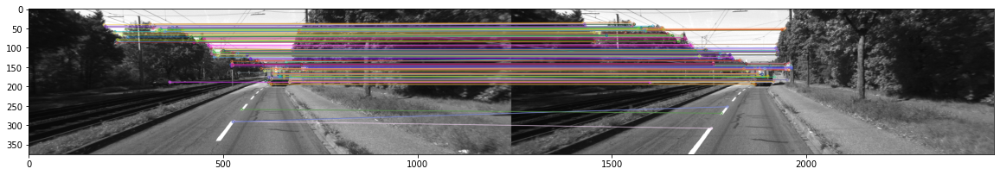

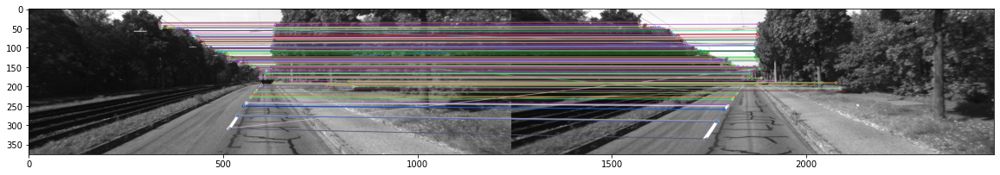

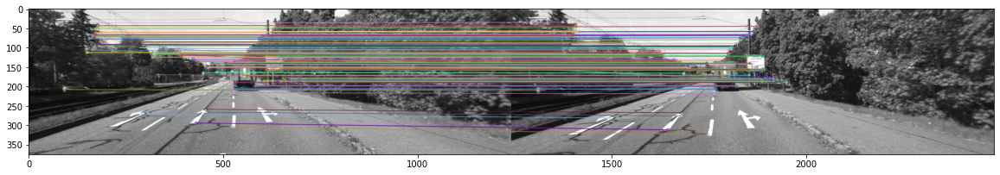

time: 1.36 s (started: 2021-02-21 03:59:28 +00:00)


In [ ]:
Random_Sample_Imgs(Str_Dir_36, ORB_BF_Elem_00_36, ORB_BF_Lista_Kp1_00_36, ORB_BF_Lista_Kp2_00_36, 3)

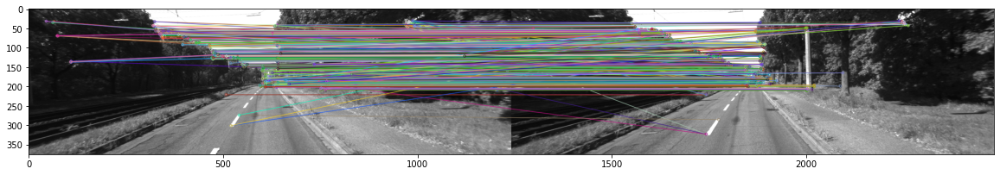

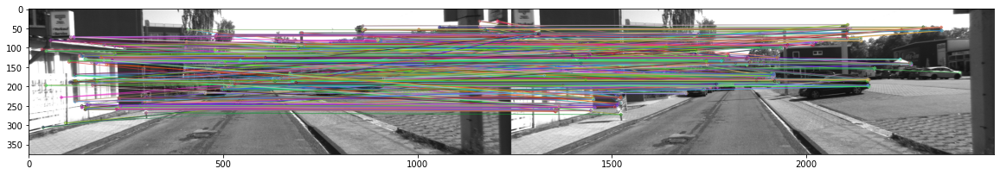

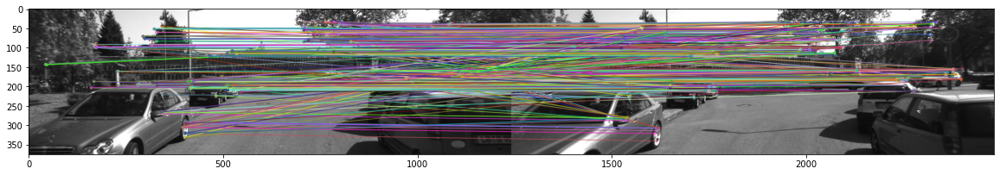

time: 1.64 s (started: 2021-02-23 01:52:00 +00:00)


In [ ]:
Random_Sample_Imgs(Str_Dir_36, ORB_FLANN_Elem_00_36, ORB_FLANN_Lista_Kp1_00_36, ORB_FLANN_Lista_Kp2_00_36, 3)

#### Secuencia 0093

In [ ]:
Str_Dir_93 = '2011_09_26/2011_09_26_drive_0093_sync/image_00/data/'
SIFT_BF_Elem_00_93, SIFT_BF_Lista_Kp1_00_93, SIFT_BF_Lista_Kp2_00_93, SIFT_BF_Pts_1_00_93, SIFT_BF_Pts_2_00_93 = Features(Str_Dir_93, 'sift',Str_Matcher_Obj='BF')
ORB_BF_Elem_00_93, ORB_BF_Lista_Kp1_00_93, ORB_BF_Lista_Kp2_00_93 ,  ORB_BF_Pts_1_00_93,  ORB_BF_Pts_2_00_93 = Features(Str_Dir_93, 'orb',Str_Matcher_Obj='BF')

time: 6min 46s (started: 2021-02-22 17:38:42 +00:00)


In [ ]:
Str_Dir_93 = '2011_09_26/2011_09_26_drive_0093_sync/image_00/data/'
SIFT_FLANN_Elem_00_93, SIFT_FLANN_Lista_Kp1_00_93, SIFT_FLANN_Lista_Kp2_00_93, SIFT_FLANN_Pts_1_00_93, SIFT_FLANN_Pts_2_00_93 = Features(Str_Dir_93, 'sift',Str_Matcher_Obj='FLANN')
ORB_FLANN_Elem_00_93, ORB_FLANN_Lista_Kp1_00_93, ORB_FLANN_Lista_Kp2_00_93, ORB_FLANN_Pts_1_00_93, ORB_FLANN_Pts_2_00_93 = Features(Str_Dir_93, 'orb',Str_Matcher_Obj='FLANN')

time: 4min 39s (started: 2021-02-22 17:45:29 +00:00)


Se compara a continuación los descriptores para cada una de las combinaciones anteriores:

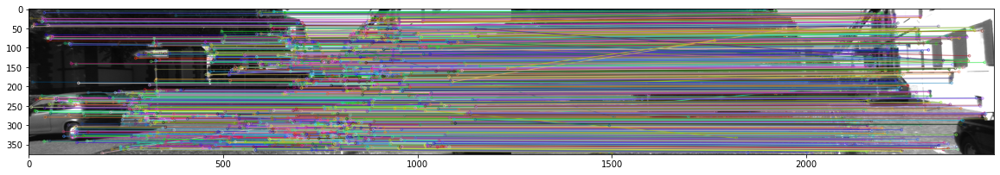

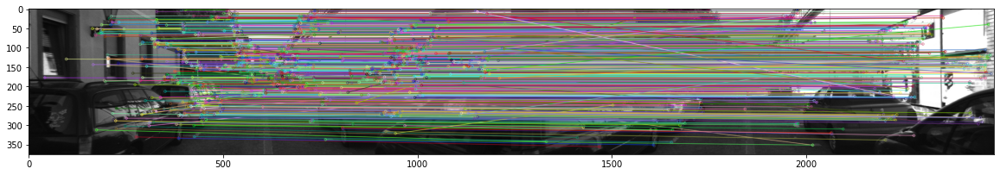

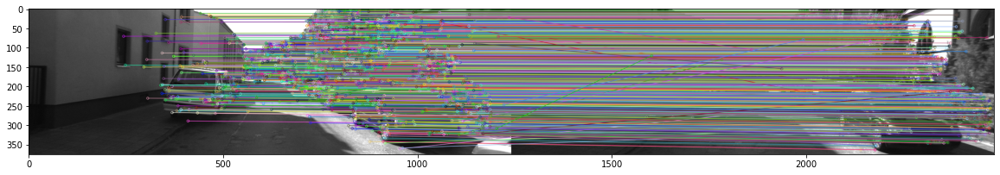

time: 1.49 s (started: 2021-02-21 03:59:30 +00:00)


In [ ]:
Random_Sample_Imgs(Str_Dir_93, SIFT_BF_Elem_00_93, SIFT_BF_Lista_Kp1_00_93, SIFT_BF_Lista_Kp2_00_93, 3)

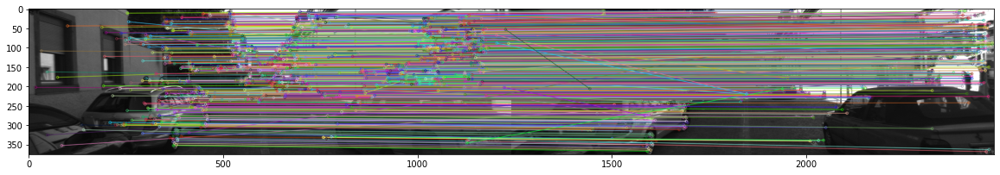

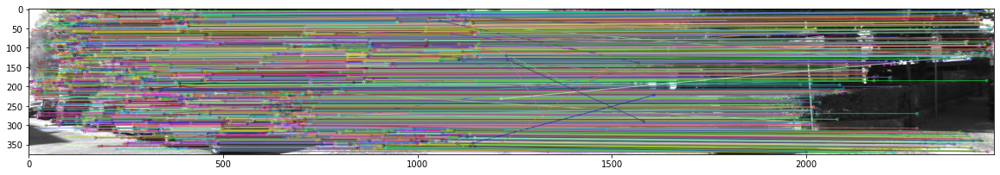

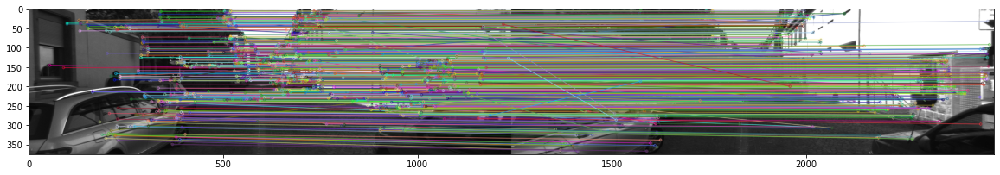

time: 1.4 s (started: 2021-02-21 03:59:32 +00:00)


In [ ]:
Random_Sample_Imgs(Str_Dir_93, SIFT_FLANN_Elem_00_93, SIFT_FLANN_Lista_Kp1_00_93, SIFT_FLANN_Lista_Kp2_00_93, 3)

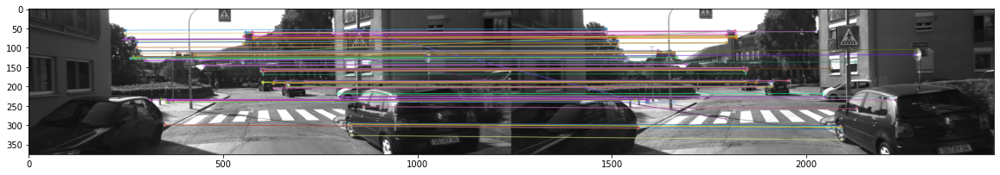

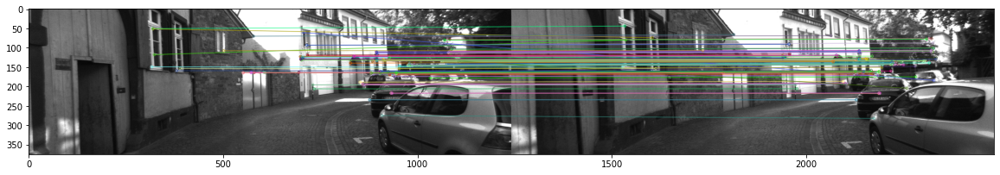

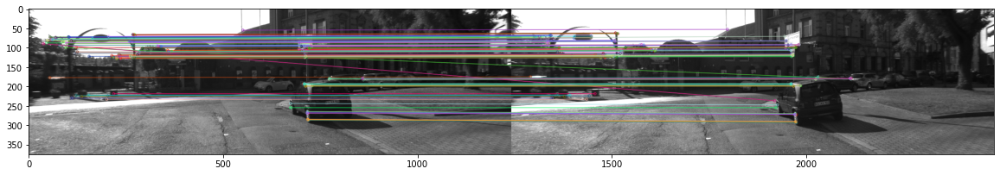

time: 1.3 s (started: 2021-02-21 03:59:33 +00:00)


In [ ]:
Random_Sample_Imgs(Str_Dir_93, ORB_BF_Elem_00_93, ORB_BF_Lista_Kp1_00_93, ORB_BF_Lista_Kp2_00_93, 3)

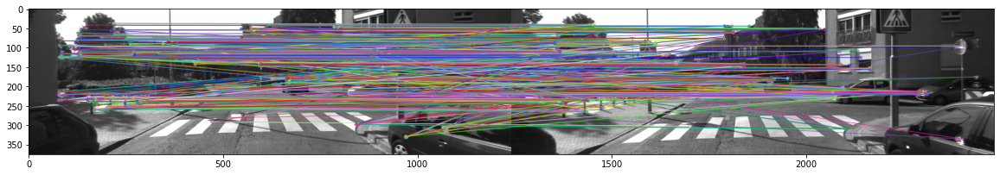

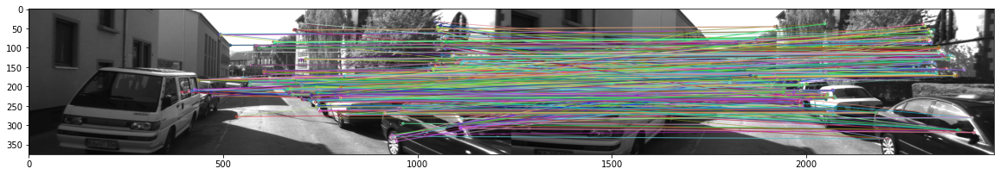

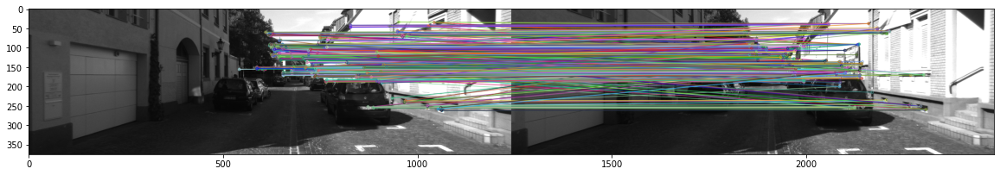

time: 1.4 s (started: 2021-02-21 03:59:35 +00:00)


In [ ]:
Random_Sample_Imgs(Str_Dir_93, ORB_FLANN_Elem_00_93, ORB_FLANN_Lista_Kp1_00_93, ORB_FLANN_Lista_Kp2_00_93, 3)

**Análisis de agrupaciones de características**

Se puede observar para las tres secuencias que los descriptores SIFT entregan una alta cantidad de calces entre las imágenes consecutivas, detectando principalmente características **tanto en elementos en los costados de las calles como en la misma calzada a recorrer**; en comparación, ORB entrega una menor cantidad de calces, y calcula estos principalmente en **objetos presentes en los costados de las calles**, como árboles y vehículos. Por último, se observa una alta cantidad de calces correctos para todos los descriptores; sin embargo, se destaca una mayor cantidad de calces incorrectos para ORB que para SIFT. Se concluye de esta manera que SIFT presenta un mejor rendimiento con respecto a ORB.

Respecto a los emparejadores, no se aprecia diferencias visuales notorias entre los emparejadores BF y FLANN respecto a los calces generados; sin embargo, se destaca un **menor tiempo de ejecución para el emparejador FLANN** en comparación con BF, lo cual es consistente con lo esperado teóricamente **[7]**. Debido a que presenta resultados comparables a BF en menor tiempo que este, se propone a FLANN como el emparejador más adecuado para este dataset.



### Estimación de movimiento

#### Five-Points

Se tiene a continuación los escenarios donde se utilizan las diferentes configuraciones de extracción de características y matchers, las cuales son:


*   SIFT + BF
*   ORB + BF
*   SIFT + FLANN
*   ORB + FLANN

Se implementarán las cuatro combinaciones para las tres secuencias, por lo que se tendrán 12 estimaciones de movimiento totales.

##### Secuencia 0014

SIFT + BF & ORB + BF

In [ ]:
SIFT_BF_Mtx_Ess_00_14, SIFT_BF_Mtx_Rot_00_14, SIFT_BF_Mtx_Trl_00_14 = Matriz_Esencial(SIFT_BF_Pts_1_00_14, SIFT_BF_Pts_2_00_14,GT_mtx_00)
ORB_BF_Mtx_Ess_00_14,  ORB_BF_Mtx_Rot_00_14,   ORB_BF_Mtx_Trl_00_14 = Matriz_Esencial(ORB_BF_Pts_1_00_14,ORB_BF_Pts_2_00_14,GT_mtx_00)
Pos_SIFT_BF_00_14 = Movimiento_R_t(SIFT_BF_Mtx_Rot_00_14, SIFT_BF_Mtx_Trl_00_14, 'b', Descriptor='SIFT', Str_Matcher_Obj= ' BF')
Pos_ORB_BF_00_14 = Movimiento_R_t(ORB_BF_Mtx_Rot_00_14, ORB_BF_Mtx_Trl_00_14,'b', Descriptor='ORB', Str_Matcher_Obj= ' BF')

NameError: ignored

SIFT + FLANN & ORB + FLANN

In [ ]:
SIFT_FLANN_Mtx_Ess_00_14, SIFT_FLANN_Mtx_Rot_00_14, SIFT_FLANN_Mtx_Trl_00_14 = Matriz_Esencial(SIFT_FLANN_Pts_1_00_14, SIFT_FLANN_Pts_2_00_14,GT_mtx_00)
ORB_FLANN_Mtx_Ess_00_14, ORB_FLANN_Mtx_Rot_00_14,ORB_FLANN_Mtx_Trl_00_14 = Matriz_Esencial(ORB_FLANN_Pts_1_00_14,ORB_FLANN_Pts_2_00_14,GT_mtx_00)
Pos_SIFT_FLANN_00_14 = Movimiento_R_t(SIFT_FLANN_Mtx_Rot_00_14, SIFT_FLANN_Mtx_Trl_00_14, 'b', Descriptor='SIFT', Str_Matcher_Obj= 'FLANN')
Pos_ORB_FLANN_00_14 = Movimiento_R_t(ORB_FLANN_Mtx_Rot_00_14, ORB_FLANN_Mtx_Trl_00_14,'b', Descriptor='ORB', Str_Matcher_Obj= 'FLANN')

##### Secuencia 0036

SIFT + BF & ORB + BF

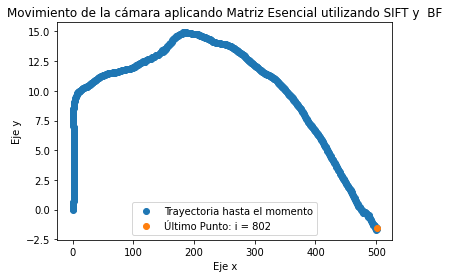

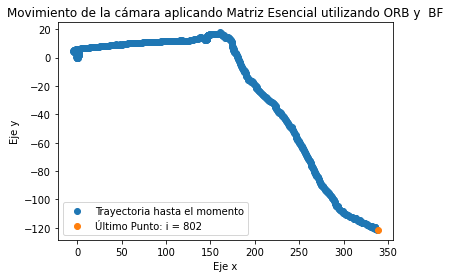

time: 11.3 s (started: 2021-02-23 02:22:37 +00:00)


In [ ]:
SIFT_BF_Mtx_Ess_00_36, SIFT_BF_Mtx_Rot_00_36, SIFT_BF_Mtx_Trl_00_36 = Matriz_Esencial(SIFT_BF_Pts_1_00_36, SIFT_BF_Pts_2_00_36,GT_mtx_00)
ORB_BF_Mtx_Ess_00_36,  ORB_BF_Mtx_Rot_00_36,   ORB_BF_Mtx_Trl_00_36 = Matriz_Esencial(ORB_BF_Pts_1_00_36,ORB_BF_Pts_2_00_36,GT_mtx_00)
Pos_SIFT_BF_00_36 = Movimiento_R_t(SIFT_BF_Mtx_Rot_00_36, SIFT_BF_Mtx_Trl_00_36, 'b', Descriptor='SIFT', Str_Matcher_Obj= ' BF')
Pos_ORB_BF_00_36 = Movimiento_R_t(ORB_BF_Mtx_Rot_00_36, ORB_BF_Mtx_Trl_00_36,'b', Descriptor='ORB', Str_Matcher_Obj= ' BF')

SIFT + FLANN & ORB + FLANN

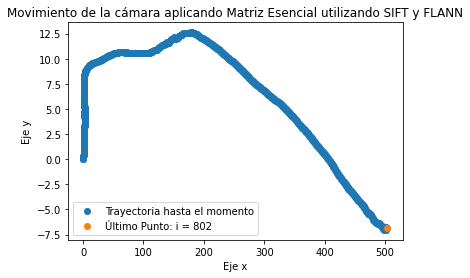

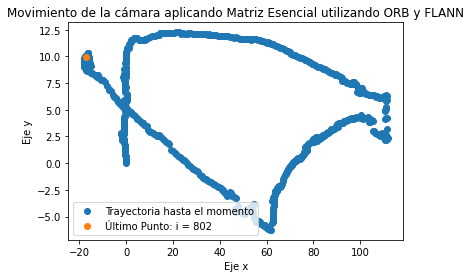

time: 12.3 s (started: 2021-02-23 02:22:49 +00:00)


In [ ]:
SIFT_FLANN_Mtx_Ess_00_36, SIFT_FLANN_Mtx_Rot_00_36, SIFT_FLANN_Mtx_Trl_00_36 = Matriz_Esencial(SIFT_FLANN_Pts_1_00_36, SIFT_FLANN_Pts_2_00_36,GT_mtx_00)
ORB_FLANN_Mtx_Ess_00_36, ORB_FLANN_Mtx_Rot_00_36,ORB_FLANN_Mtx_Trl_00_36 = Matriz_Esencial(ORB_FLANN_Pts_1_00_36,ORB_FLANN_Pts_2_00_36,GT_mtx_00)
Pos_SIFT_FLANN_00_36 = Movimiento_R_t(SIFT_FLANN_Mtx_Rot_00_36, SIFT_FLANN_Mtx_Trl_00_36, 'b', Descriptor='SIFT', Str_Matcher_Obj= 'FLANN')
Pos_ORB_FLANN_00_36 = Movimiento_R_t(ORB_FLANN_Mtx_Rot_00_36, ORB_FLANN_Mtx_Trl_00_36,'b', Descriptor='ORB', Str_Matcher_Obj= 'FLANN')

##### Secuencia 0093

SIFT + BF & ORB + BF

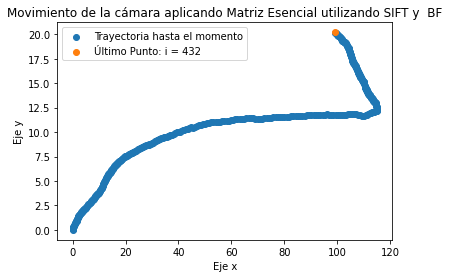

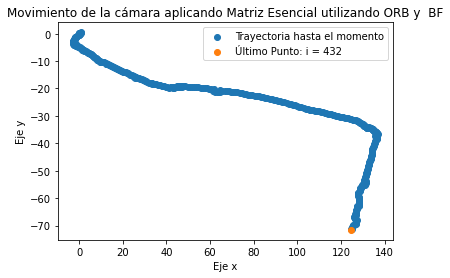

time: 5.03 s (started: 2021-02-21 01:28:58 +00:00)


In [ ]:
SIFT_BF_Mtx_Ess_00_93, SIFT_BF_Mtx_Rot_00_93, SIFT_BF_Mtx_Trl_00_93 = Matriz_Esencial(SIFT_BF_Pts_1_00_93, SIFT_BF_Pts_2_00_93,GT_mtx_00)
ORB_BF_Mtx_Ess_00_93,  ORB_BF_Mtx_Rot_00_93,   ORB_BF_Mtx_Trl_00_93 = Matriz_Esencial(ORB_BF_Pts_1_00_93,ORB_BF_Pts_2_00_93,GT_mtx_00)
Pos_SIFT_BF_00_93 = Movimiento_R_t(SIFT_BF_Mtx_Rot_00_93, SIFT_BF_Mtx_Trl_00_93, 'b', Descriptor='SIFT', Str_Matcher_Obj= ' BF')
Pos_ORB_BF_00_93  = Movimiento_R_t(ORB_BF_Mtx_Rot_00_93, ORB_BF_Mtx_Trl_00_93,'b', Descriptor='ORB', Str_Matcher_Obj= ' BF')

SIFT + FLANN & ORB + FLANN

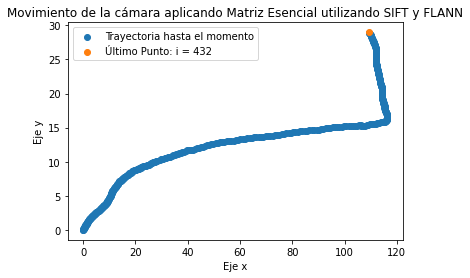

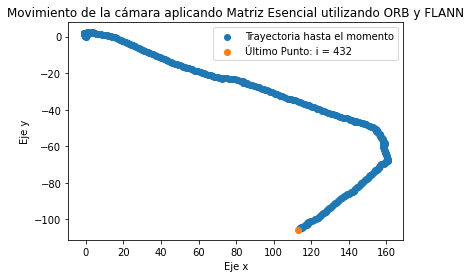

time: 5.46 s (started: 2021-02-21 01:29:03 +00:00)


In [ ]:
SIFT_FLANN_Mtx_Ess_00_93, SIFT_FLANN_Mtx_Rot_00_93, SIFT_FLANN_Mtx_Trl_00_93 = Matriz_Esencial(SIFT_FLANN_Pts_1_00_93, SIFT_FLANN_Pts_2_00_93,GT_mtx_00)
ORB_FLANN_Mtx_Ess_00_93, ORB_FLANN_Mtx_Rot_00_93,ORB_FLANN_Mtx_Trl_00_93 = Matriz_Esencial(ORB_FLANN_Pts_1_00_93,ORB_FLANN_Pts_2_00_93,GT_mtx_00)
Pos_SIFT_FLANN_00_93 = Movimiento_R_t(SIFT_FLANN_Mtx_Rot_00_93, SIFT_FLANN_Mtx_Trl_00_93, 'b', Descriptor='SIFT', Str_Matcher_Obj= 'FLANN')
Pos_ORB_FLANN_00_93 = Movimiento_R_t(ORB_FLANN_Mtx_Rot_00_93, ORB_FLANN_Mtx_Trl_00_93,'b', Descriptor='ORB', Str_Matcher_Obj= 'FLANN')

##### Visualización de secuencias paso a paso

Se utiliza la función **Animacion_Ruta()** para generar una animación interactiva de la estimación de las rutas. Como el informe y el código comparten el mismo ambiente, no se ejecutará para la presentación del informe, con el fin de no saturar el espacio del mismo.

###### Secuencia 14

**SIFT**

In [ ]:
Animacion_SIFT_BF_00_14 = Animacion_Ruta(Str_Dir_14,
                                            Pos_Obj=Pos_SIFT_BF_00_14,
                                            Ratio = 5,Descriptor = 'SIFT',
                                            Str_Matcher_Obj='BF')
plt.show()
clear_output()
rc('animation', html='jshtml')
Animacion_SIFT_BF_00_14    # or HTML(anim.to_jshtml())

In [ ]:
Animacion_SIFT_FLANN_00_14 = Animacion_Ruta(Str_Dir_14,
                                            Pos_Obj=Pos_SIFT_FLANN_00_14,
                                            Ratio = 5,Descriptor = 'SIFT',
                                            Str_Matcher_Obj='FLANN')
plt.show()
clear_output()
rc('animation', html='jshtml')
Animacion_SIFT_FLANN_00_14    # or HTML(anim.to_jshtml())

**ORB**

In [ ]:
Animacion_ORB_BF_00_14 = Animacion_Ruta(Str_Dir_14,
                                            Pos_Obj=Pos_ORB_BF_00_14,
                                            Ratio = 5,Descriptor = 'ORB',
                                            Str_Matcher_Obj='BF')
plt.show()
clear_output()
rc('animation', html='jshtml')
Animacion_ORB_BF_00_14    # or HTML(anim.to_jshtml())

In [ ]:
Animacion_ORB_FLANN_00_14 = Animacion_Ruta(Str_Dir_14,
                                            Pos_Obj=Pos_ORB_FLANN_00_14,
                                            Ratio = 5,Descriptor = 'ORB',
                                            Str_Matcher_Obj='FLANN')
plt.show()
clear_output()
rc('animation', html='jshtml')
Animacion_ORB_FLANN_00_14    # or HTML(anim.to_jshtml())

###### Secuencia 36

**SIFT**

In [ ]:
Animacion_SIFT_BF_00_36 = Animacion_Ruta(Str_Dir_36,
                                            Pos_Obj=Pos_SIFT_BF_00_36,
                                            Ratio = 5,Descriptor = 'SIFT',
                                            Str_Matcher_Obj='BF')
plt.show()
clear_output()
rc('animation', html='jshtml')
Animacion_SIFT_BF_00_36    # or HTML(anim.to_jshtml())

In [ ]:
Animacion_SIFT_FLANN_00_36 = Animacion_Ruta(Str_Dir_36,
                                            Pos_Obj=Pos_SIFT_FLANN_00_36,
                                            Ratio = 5,Descriptor = 'SIFT',
                                            Str_Matcher_Obj='FLANN')
plt.show()
clear_output()
rc('animation', html='jshtml')
Animacion_SIFT_FLANN_00_36    # or HTML(anim.to_jshtml())

**ORB**

In [ ]:
Animacion_ORB_BF_00_36 = Animacion_Ruta(Str_Dir_36,
                                            Pos_Obj=Pos_ORB_BF_00_36,
                                            Ratio = 5,Descriptor = 'ORB',
                                            Str_Matcher_Obj='BF')
plt.show()
clear_output()
rc('animation', html='jshtml')
Animacion_ORB_BF_00_36    # or HTML(anim.to_jshtml())

In [ ]:
Animacion_ORB_FLANN_00_36 = Animacion_Ruta(Str_Dir_36,
                                            Pos_Obj=Pos_ORB_FLANN_00_36,
                                            Ratio = 5,Descriptor = 'ORB',
                                            Str_Matcher_Obj='FLANN')
plt.show()
clear_output()
rc('animation', html='jshtml')
Animacion_ORB_FLANN_00_36    # or HTML(anim.to_jshtml())

###### Secuencia 93

**SIFT**

In [ ]:
Animacion_SIFT_BF_00_93 = Animacion_Ruta(Str_Dir_93,
                                            Pos_Obj=Pos_SIFT_BF_00_93,
                                            Ratio = 5,Descriptor = 'SIFT',
                                            Str_Matcher_Obj='BF')
plt.show()
clear_output()
rc('animation', html='jshtml')
Animacion_SIFT_BF_00_93    # or HTML(anim.to_jshtml())

In [ ]:
Animacion_SIFT_FLANN_00_93 = Animacion_Ruta(Str_Dir_93,
                                            Pos_Obj=Pos_SIFT_FLANN_00_93,
                                            Ratio = 5,Descriptor = 'SIFT',
                                            Str_Matcher_Obj='FLANN')
plt.show()
clear_output()
rc('animation', html='jshtml')
Animacion_SIFT_FLANN_00_93    # or HTML(anim.to_jshtml())

**ORB**

In [ ]:
Animacion_ORB_BF_00_93 = Animacion_Ruta(Str_Dir_93,
                                            Pos_Obj=Pos_ORB_BF_00_93,
                                            Ratio = 5,Descriptor = 'ORB',
                                            Str_Matcher_Obj='BF')
plt.show()
clear_output()
rc('animation', html='jshtml')
Animacion_ORB_BF_00_93    # or HTML(anim.to_jshtml())

In [ ]:
Animacion_ORB_FLANN_00_93 = Animacion_Ruta(Str_Dir_93,
                                            Pos_Obj=Pos_ORB_FLANN_00_93,
                                            Ratio = 5,Descriptor = 'ORB',
                                            Str_Matcher_Obj='FLANN')
plt.show()
clear_output()
rc('animation', html='jshtml')
Animacion_ORB_FLANN_00_93    # or HTML(anim.to_jshtml())

##### **Análisis**

Se puede observar que para las tres secuencias, el uso de los dos emparejadores entrega resultados diferentes entre ambos descriptores, siendo notorio el caso de ORB en la secuencia 14, donde Brute Force entrega puntos dispersos y cortes entre la ruta predecida. Se observa que, para ambos emparejadores, el uso de detectores SIFT entrega rutas con un movimiento más compacto, siendo apreciable una menor dispersión respecto a la posición de la cámara a través de la secuencia de imágenes; en cambio, ORB entrega resultados más irregulares a lo largo de la trayectoria. 

Observando las secuencias objetivos por frames, se aprecia que en la secuencia 0014 Brute-Force Matching detecta una curva inicial pronunciada para ambos casos; para ORB, se presenta una serie de curvas y cortes en el resto de su trayectoria, a diferencia de SIFT, que ilustra una trayectoria curvilínea continua; de manera similar, FLANN detecta una curva inicial al principio, obteniendo una sección recta al utilizar SIFT, y una serie de curvas al utilizar ORB. Analizando manualmente la secuencia objetivo frame a frame mediante la animación generada, es posible observar que **se presenta una curva inicial pronunciada seguida de una trayectoria principalmente recta**, siendo esto similar a lo obtenido en la combinación SIFT + FLANN. De acuerdo a lo observado en esta secuencia, se determina que la combinación con mejores resultados es SIFT + FLANN , entregando una estimación certera de la ruta efectuada. Se destaca el pobre desempeño de ORB, indicando la presencia de curvas inexistentes.

En la secuencia 36 se aprecia que ambos emparejadores utilizando SIFT poseen una forma similar, presentándose un camino recto al inicio, una curva, luego otro avance, posteriormente otra curva, y finalmente un camino relativamente recto; en cambio, ORB entrega resultados distintos tanto para BF como para FLANN. Observando los resultados de ambos emparejadores, se observa que **el movimiento a lo largo de los ejes es distinto entre SIFT y ORB**, presentándose para el primero un amplio movimiento lateral, mientras que para ORB un amplio movimiento en el eje Y. Analizando los resultados obtenidos con lo observado frame a frame en la secuencia, es posible observar que en esta última **se presenta una trayectoria recta, seguida de una curva hacia la derecha, luego una sección curvilínea, una curva hacia la derecha, y finalmente un tramo recto**, lo cual coincide con lo observado **al usar los descriptores SIFT**. Como la trayectoria presente en los frames presenta curvas cerradas, y la sección final es más extensa que la sección  recta inicial, se concluye que la combinación SIFT + FLANN entrega una aproximación más fidedigna de la trayectoria objetivo. Se destaca el **desempeño deficiente de la combinación ORB + FLANN**, con una anormal serie de curvas en comparación con las otras 3 combinaciones.

A diferencia de las dos secuencias anteriores, la secuencia 93 presenta resultados similares para las cuatro combinaciones: una sección recta/curvilínea, seguida de una curva cerrada, y finalmente un tramo recto. Se destaca que **la trayectoria se registra de manera invertida entre los descriptores SIFT y ORB en el eje Y**. Comparando entre BF y FLANN, se observa que para el primer emparejador el primer trayecto es curvilíneo, mientras que FLANN lo detecta como un tramo prácticamente recto. Comparando los resultados obtenidos con la secuencia original frame a frame, se puede apreciar que se presenta **una trayectoria curvilínea, seguida de una curva cerrada a la izquierda, finalizando con un tramo recto**, siendo SIFT + FLANN la combinación más cercana a la secuencia objetivo.

Finalmente, al analizar cada descriptor por separado, se observa que ORB **no detecta consistentemente** la presencia de curvas, entregando curvas inexistentes en la secuencia 14 y secuencia 36 (utilizando en esta última FLANN), e inversión de la dirección de las curvas detectadas; en contraste, **el uso de SIFT detecta adecuadamente las curvas presentes**, estando estas orientados de manera correcta. Así, se concluye que el mejor descriptor para estas secuencias ha sido el descriptor **SIFT**, mientras que los resultados más cercanos a lo esperado teóricamente se dieron al operar el emparejador FLANN. Se concluye así que la mejor combinación para las tres secuencias observadas resultó ser **SIFT + FLANN**.

#### Perspective-n-Point



##### Secuencia 14

In [ ]:
Str_L_14 = '2011_09_26/2011_09_26_drive_0014_sync/image_00/data/'
Str_R_14 = '2011_09_26/2011_09_26_drive_0014_sync/image_01/data/'
Pts_2D_00_14, Pts_3D_00_14 = PnP_Mapping(Str_L_14, Str_R_14, GT_mtx_00, GT_dist_00, GT_mtx_01, GT_dist_01, GT_Rot_01, GT_Trl_01)

time: 5min 9s (started: 2021-02-23 17:00:15 +00:00)


In [ ]:
PnP_Anim = Animacion_PnP(Pts_2D_00_14)
plt.show()
clear_output()
rc('animation', html='jshtml')
PnP_Anim   # or HTML(anim.to_jshtml())

##### Secuencia 36

In [ ]:
Str_L_36 = '2011_09_26/2011_09_26_drive_0036_sync/image_00/data/'
Str_R_36 = '2011_09_26/2011_09_26_drive_0036_sync/image_01/data/'
Pts_2D_00_36, Pts_3D_00_36 = PnP_Mapping(Str_L_36, Str_R_36, GT_mtx_00, GT_dist_00, GT_mtx_01, GT_dist_01, GT_Rot_01, GT_Trl_01)

time: 12min 59s (started: 2021-02-23 17:45:07 +00:00)


La animación de la secuencia 36 consume mucha RAM y colapsa el entorno de Colab, por lo que se añadió un parámetro extra con el fin de reducir la memoria utilizada a costa de mostrar menos frames.

In [ ]:
PnP_Anim = Animacion_PnP(Pts_2D_00_36, 3)
plt.show()
clear_output()
rc('animation', html='jshtml')
PnP_Anim   # or HTML(anim.to_jshtml())

##### Secuencia 93

In [ ]:
Str_L_93 = '2011_09_26/2011_09_26_drive_0093_sync/image_00/data/'
Str_R_93 = '2011_09_26/2011_09_26_drive_0093_sync/image_01/data/'
Pts_2D_00_93, Pts_3D_00_93 = PnP_Mapping(Str_L_93, Str_R_93, GT_mtx_00, GT_dist_00, GT_mtx_01, GT_dist_01, GT_Rot_01, GT_Trl_01)

time: 7min 9s (started: 2021-02-23 17:05:39 +00:00)


In [ ]:
PnP_Anim = Animacion_PnP(Pts_2D_00_93)
plt.show()
clear_output()
rc('animation', html='jshtml')
PnP_Anim   # or HTML(anim.to_jshtml())

**Análisis**

Los mapas de disparidad obtenidos no tienen una calidad apropiada para lo esperado teóricamente: no se percibe de manera consistente la profundidad en las tres secuencias, lo cual se atribuye a la calibración de los parámetros. A pesar de que se logra captar cuando los objetos se acercan a la cámara, y se distingue claramente el cielo del resto, el desempeño del mapa se encuentra muy por debajo de lo apropiado para implementar el algoritmo.

Por otra parte, no se logró implementar la extracción de la matriz de rotación y traslación en base a los mapas obtenidos debido a fallos respecto a la implementación de funciones en OpenCV. Cabe destacar que, en el estado actual de los mapas de disparidad obtenidos, se espera un desempeño de la estimación de movimiento inferior al logrado por el algoritmo Five-Points.

De esta manera, se concluye que los objetivos propuestos respecto a PnP no han sido satisfactoriamente cumplidos.

# Conclusiones

En esta actividad se logró implementar, utilizando los parámetros de una cámara calibrada, **una estimación de movimiento mediante el algoritmo five-points a partir de secuencias de imágenes**, obteniendo una ruta estimada del movimiento del vehículo. Los resultados permiten observar que **el desempeño de los descriptores SIFT es superior al de los descriptores ORB** para los 12 casos distintos, destacando notoriamente el desempeño de la combinación **SIFT + FLANN**. Se observa que la cámara, bajo esas configuraciones, permite detectar si se presenta un camino recto/curvilíneo, curvas leves y curvas cerrradas. 

Los resultados obtenidos para este apartado se encuentran dentro de lo esperado teóricamente: se detecta adecuadamente la presencia de tramos rectos/curvilíneos y virajes de manera adecuada, ofreciendo una aproximación fiable del movimiento del vehículo. De esta forma, se declaran como cumplidos los objetivos planteados para la sección de Five-Points.

Por otra parte, si bien se logró obtener los mapas de disparidad para la implementación del algoritmo PnP, la calidad de estos no es la esperada teóricamente; además, no se logró obtener los parámetros extrínsecos del movimiento de la cámara, por lo que no se logró estimar el movimiento de la cámara en las secuencias. Debido a esto, se declaran los objetivos de la sección de PnP como no cumplidos. Dada la calidad de los mapas de disparidad obtenido con los parámetros, se espera un rendimiento inferior al obtenido con el algoritmo five-points.

Los aprendizajes adquiridos en esta tarea consistieron en la experiencia al implementar un método de estimación de movimiento mediante el uso de **descriptores en una secuencia de imágenes consecutivas cronológicamente**, permitiendo un **acercamiento a herramientas que permiten contribuir a la navegación de vehículos autónomos**. Las dificultades presentes en la experiencia consistieron en la implementación de los códigos de las funciones de la librería OpenCV, siendo la mayor parte del tiempo empleado en la actividad la correcta implementación de estas.

# Trabajo futuro

Se espera a futuro poder implementar la sección final del algoritmo Perspective-n-Point, utilizando los mapas de disparidad obtenidos para calcular la matriz de rotación y traslación entre frames consecutivos. Además, es posible mejorar los mapas obtenidos para que capten con precisión la distancia de los objetos a la cámara. Con dichas mejoras, será posible implementar la trayectoria de manera similar a lo efectuado con el algoritmo Five-Points.

Por otra parte, es posible mejorar la implementación de five-points tanto en la detección precisa de la trayectoria del vehículo al estar detenido, como en la estimación de movimiento en curvas cerradas a pequeña escala. Otro punto a mejorar es la exactitud del ángulo en las curvas, ya que actualmente se presenta un leve error en los ángulos de algunas curvas que podría escalar en trayectorias erróneas a larga escala.

# Referencias

[1] *OpenCV: Camera Calibration*. [En línea]. Disponible en https://docs.opencv.org/master/dc/dbb/tutorial_py_calibration.html

[2] *OpenCV: Camera Calibration and 3D Reconstruction*. [En línea]. Disponible en https://docs.opencv.org/3.4/d9/d0c/group__calib3d.html

[3] *OpenCV: Feature Matching*. [En línea]. Disponible en https://docs.opencv.org/3.4/dc/dc3/tutorial_py_matcher.html

[4] *OpenCV: Introduction to SIFT (Scale-Invariant Feature Transform)*. [En línea]. Disponible en  https://docs.opencv.org/3.4/da/df5/tutorial_py_sift_intro.html

[5] *OpenCV: ORB (Oriented FAST and Rotated BRIEF)*. [En línea]. Disponible en  https://docs.opencv.org/3.4/d1/d89/tutorial_py_orb.html

[6] Kaehler, A. and Bradski, G., 2016. *Learning OpenCV 3*. 1era ed.

[7] M. Muja and D. G. Lowe, "Scalable Nearest Neighbor Algorithms for High Dimensional Data," en *IEEE Transactions on Pattern Analysis and Machine Intelligence*, vol. 36, no. 11, pp. 2227-2240, 1 Nov. 2014. [En línea]. Disponible en https://ieeexplore.ieee.org/document/6809191